# Import Libraries

In [5]:
import sys
import os

import pandas as pd
from pandas.plotting import autocorrelation_plot

from matplotlib import pyplot
from dateutil import parser
import datetime

import numpy as np

from multiprocessing import cpu_count
from joblib import Parallel
from joblib import delayed
from warnings import catch_warnings
from warnings import filterwarnings
from statsmodels.tsa.holtwinters import ExponentialSmoothing

from statsmodels.tsa.api import VAR
from statsmodels.tsa.stattools import adfuller
from statsmodels.tools.eval_measures import rmse, aic

from numpy import array

print("Loaded")

Loaded


# Import Data

In [2]:
# # from google.colab import drive
# # drive.mount('/content/drive')

# # Add path to root directory with data
# sys.path += ['/content/drive/My Drive/UCLA/Classes/Computer Science/CS145/Team 3 - Kaggle/Data']

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [21]:
train_df = pd.read_csv('data/train.csv', parse_dates=['Date'])
# train_df.drop(['ID', 'Recovered', 'Active', 'Incident_Rate', 'People_Tested', 'People_Hospitalized', 'Mortality_Rate', 'Testing_Rate', 'Hospitalization_Rate'], inplace=True, axis=1)

In [22]:
test_df = pd.read_csv('data/test.csv', parse_dates=['Date'])

# Create 2 new dataframes

In [48]:
train_df

,ID,Province_State,Date,Confirmed,Deaths,Recovered,Active,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,Testing_Rate,Hospitalization_Rate
0,0,Alabama,2020-04-12,3563,93,NaN,3470.0,75.988020,21583.0,437.0,2.610160,460.300152,12.264945
1,1,Alaska,2020-04-12,272,8,66.0,264.0,45.504049,8038.0,31.0,2.941176,1344.711576,11.397059
2,2,Arizona,2020-04-12,3542,115,NaN,3427.0,48.662422,42109.0,NaN,3.246753,578.522286,NaN
3,3,Arkansas,2020-04-12,1280,27,367.0,1253.0,49.439423,19722.0,130.0,2.109375,761.753354,10.156250
4,4,California,2020-04-12,22795,640,NaN,22155.0,58.137726,190328.0,5234.0,2.812020,485.423869,22.961176
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7095,7095,Virginia,2020-08-31,120575,2580,15085.0,102910.0,1412.626461,1586551.0,NaN,2.139747,18587.633628,NaN
7096,7096,Washington,2020-08-31,74635,1915,NaN,72720.0,980.118828,1461354.0,NaN,2.565820,19190.735838,NaN
7097,7097,West Virginia,2020-08-31,10249,215,8017.0,2017.0,571.883891,436047.0,NaN,2.097766,24330.984010,NaN
7098,7098,Wisconsin,2020-08-31,75603,1122,67234.0,7247.0,1298.477578,1253422.0,NaN,1.484068,21527.457417,NaN


In [65]:
confirmed_df = train_df[['Province_State', 'Date', 'Confirmed']]
deaths_df = train_df[['Province_State', 'Date', 'Deaths']]

In [66]:
state_names = train_df.Province_State.unique()
state_names

array(['Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California',
       'Colorado', 'Connecticut', 'Delaware', 'Florida', 'Georgia',
       'Hawaii', 'Idaho', 'Illinois', 'Indiana', 'Iowa', 'Kansas',
       'Kentucky', 'Louisiana', 'Maine', 'Maryland', 'Massachusetts',
       'Michigan', 'Minnesota', 'Mississippi', 'Missouri', 'Montana',
       'Nebraska', 'Nevada', 'New Hampshire', 'New Jersey', 'New Mexico',
       'New York', 'North Carolina', 'North Dakota', 'Ohio', 'Oklahoma',
       'Oregon', 'Pennsylvania', 'Rhode Island', 'South Carolina',
       'South Dakota', 'Tennessee', 'Texas', 'Utah', 'Vermont',
       'Virginia', 'Washington', 'West Virginia', 'Wisconsin', 'Wyoming'],
      dtype=object)

In [67]:
group_by_state = train_df.groupby(train_df.Province_State)
training_grouped_by_state = pd.DataFrame()

for state in state_names:
  state_specific_df = pd.DataFrame(group_by_state.get_group(state))
  training_grouped_by_state = training_grouped_by_state.append(state_specific_df)

# Reset index since group by creates incorrect indexes
training_grouped_by_state = training_grouped_by_state.reset_index(drop=True)

training_grouped_by_state

,Province_State,Date,Confirmed,Deaths,Recovered,Active,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,Testing_Rate,Hospitalization_Rate
0,Alabama,2020-04-12,3563,93,NaN,3470.0,75.988020,21583.0,437.0,2.610160,460.300152,12.264945
1,Alabama,2020-04-13,3734,99,NaN,3635.0,79.634933,29182.0,457.0,2.651312,622.363852,12.238886
2,Alabama,2020-04-14,3953,114,NaN,3839.0,84.305541,33117.0,493.0,2.883886,706.285508,12.471541
3,Alabama,2020-04-15,4075,118,NaN,3957.0,86.907433,34077.0,525.0,2.895706,726.759406,12.883436
4,Alabama,2020-04-16,4345,133,NaN,4212.0,92.665716,36391.0,553.0,3.060990,776.110032,12.727273
...,...,...,...,...,...,...,...,...,...,...,...,...
7095,Wyoming,2020-08-27,3733,37,3060.0,636.0,645.000769,74532.0,215.0,0.991160,12877.899091,5.759443
7096,Wyoming,2020-08-28,3803,37,3086.0,680.0,657.095613,75236.0,NaN,0.972916,12999.538668,NaN
7097,Wyoming,2020-08-29,3795,37,3116.0,642.0,655.713345,75257.0,NaN,0.974967,13003.167121,NaN
7098,Wyoming,2020-08-30,3829,37,3136.0,656.0,661.587984,75293.0,NaN,0.966310,13009.387327,NaN


# Confirmed Dataset Modeling

### Make plots for each state

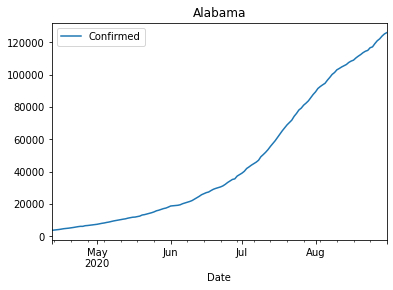

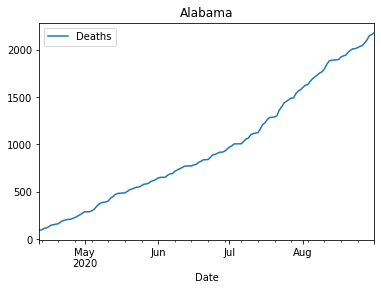

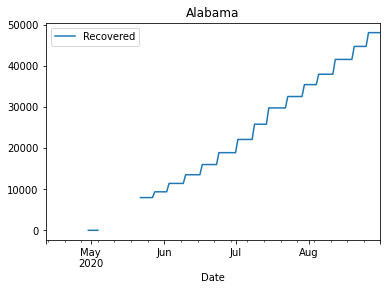

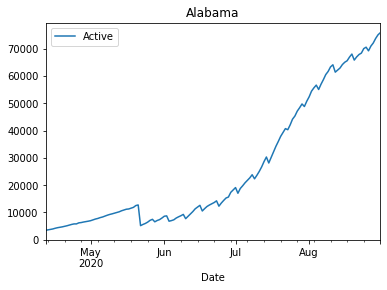

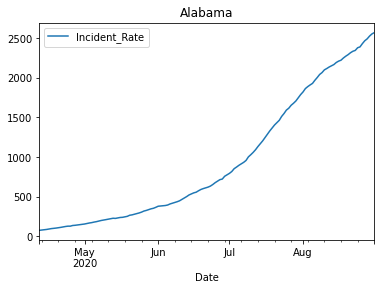

...

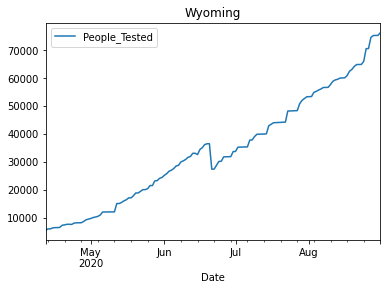

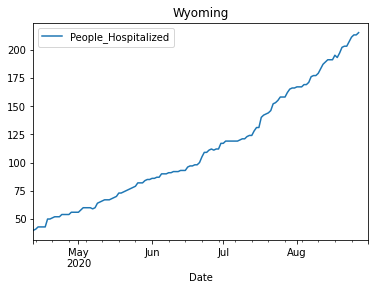

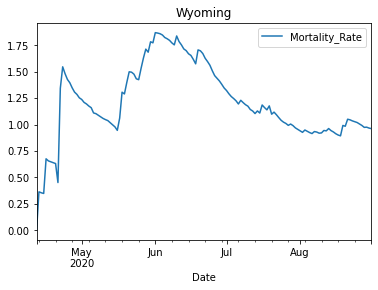

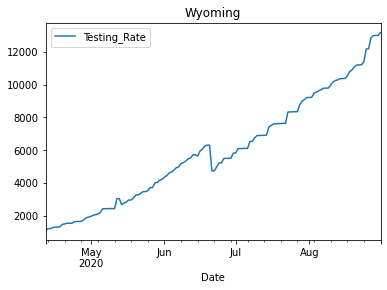

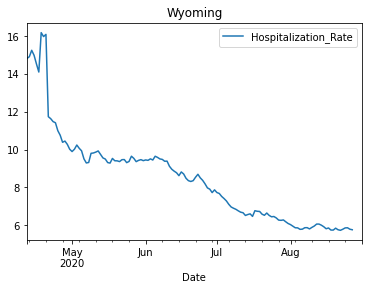

In [79]:

for state in state_names:
    for feature in training_grouped_by_state:
        if(feature == "Province_State" or feature == "Date"):
            continue
        state_df = training_grouped_by_state[training_grouped_by_state.Province_State == state][['Date', feature]]
        state_df.plot(x='Date',y=feature, title=state)
        pyplot.show()

### Granger Causation Confirmations per State

In [121]:
# Split data into state-by-state dataframes
state_splits = [x for _, x in training_grouped_by_state.groupby(training_grouped_by_state['Province_State'])]
state_splits
# state_names
for state in state_splits:
    state.drop(['Province_State','Date'], inplace=True, axis=1)
    state.fillna(0,inplace=True, axis=1) #replace with mean or other method(s)


In [122]:
from statsmodels.tsa.stattools import grangercausalitytests
maxlag=12
test = 'ssr_chi2test'
def grangers_causation_matrix(data, variables, test='ssr_chi2test', verbose=False):    
    """Check Granger Causality of all possible combinations of the Time series.
    The rows are the response variable, columns are predictors. The values in the table 
    are the P-Values. P-Values lesser than the significance level (0.05), implies 
    the Null Hypothesis that the coefficients of the corresponding past values is 
    zero, that is, the X does not cause Y can be rejected.

    data      : pandas dataframe containing the time series variables
    variables : list containing names of the time series variables.
    """
    df = pd.DataFrame(np.zeros((len(variables), len(variables))), columns=variables, index=variables)
    for c in df.columns:
        for r in df.index:
            test_result = grangercausalitytests(data[[r, c]], maxlag=maxlag, verbose=False)
            p_values = [round(test_result[i+1][0][test][1],4) for i in range(maxlag)]
            if verbose: print(f'Y = {r}, X = {c}, P Values = {p_values}')
            min_p_value = np.min(p_values)
            df.loc[r, c] = min_p_value
    df.columns = [var + '_x' for var in variables]
    df.index = [var + '_y' for var in variables]
    return df
i=0
granger_causalities = list()
for state in state_splits:
    print("#=====================#")
    print(state_names[i])
    r= grangers_causation_matrix(state, variables = state.columns)  
    print(r)
    granger_causalities.append(r)
    print("#=====================#")
    i+=1

#=====================#
Alabama
                        Confirmed_x  Deaths_x  Recovered_x  Active_x  \
Confirmed_y                  1.0000    0.0017       0.0000    0.0000   
Deaths_y                     0.0000    1.0000       0.0121    0.0000   
Recovered_y                  0.0273    0.0004       1.0000    0.0246   
Active_y                     0.0000    0.0014       0.0000    1.0000   
Incident_Rate_y              0.0004    0.0020       0.0000    0.0000   
People_Tested_y              0.0193    0.1674       0.0021    0.0222   
People_Hospitalized_y        0.0000    0.2076       0.2732    0.0463   
Mortality_Rate_y             0.0449    0.0003       0.0000    0.5377   
Testing_Rate_y               0.0211    0.2713       0.0010    0.0263   
Hospitalization_Rate_y       0.0004    0.0827       0.0999    0.0516   

                        Incident_Rate_x  People_Tested_x  \
Confirmed_y                      0.0008           0.0000   
Deaths_y                         0.0000           0.000

                        Confirmed_x  Deaths_x  Recovered_x  Active_x  \
Confirmed_y                  1.0000    0.0005       0.0000    0.0000   
Deaths_y                     0.0015    1.0000       0.0000    0.0017   
Recovered_y                  0.0000    0.0791       1.0000    0.0000   
Active_y                     0.0001    0.1730       0.0000    1.0000   
Incident_Rate_y              0.0000    0.0028       0.0000    0.0000   
People_Tested_y              0.0005    0.2271       0.0000    0.0002   
People_Hospitalized_y        0.0570    0.0000       0.4897    0.0257   
Mortality_Rate_y             0.3148    0.2047       0.3508    0.0068   
Testing_Rate_y               0.0049    0.2525       0.0000    0.0002   
Hospitalization_Rate_y       0.0000    0.0001       0.0005    0.0005   

                        Incident_Rate_x  People_Tested_x  \
Confirmed_y                      0.0000           0.0000   
Deaths_y                         0.0065           0.0578   
Recovered_y                

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:1400: RuntimeWarning: invalid value encountered in double_scalars
  * res2djoint.df_resid
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:1421: RuntimeWarning: invalid value encountered in double_scalars
  fgc2 = res2down.nobs * (res2down.ssr - res2djoint.ssr) / res2djoint.ssr
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/regression/linear_model.py:903: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:1430: RuntimeWarning: invalid value encountered in double_scalars
  lr = -2 * (res2down.llf - r

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 4, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 1, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 1, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.

                        Confirmed_x  Deaths_x  Recovered_x  Active_x  \
Confirmed_y                  1.0000    0.0000          1.0    0.0000   
Deaths_y                     0.0000    1.0000          1.0    0.0000   
Recovered_y                     NaN       NaN          NaN       NaN   
Active_y                     0.0000    0.0000          1.0    1.0000   
Incident_Rate_y              0.0029    0.0000          1.0    0.0001   
People_Tested_y              0.0000    0.0000          1.0    0.0000   
People_Hospitalized_y        0.7766    0.6336          1.0    0.7789   
Mortality_Rate_y             0.0465    0.0000          1.0    0.0454   
Testing_Rate_y               0.0000    0.0000          1.0    0.0000   
Hospitalization_Rate_y       0.7797    0.6526          1.0    0.7817   

                        Incident_Rate_x  People_Tested_x  \
Confirmed_y                      0.0033           0.0000   
Deaths_y                         0.0000           0.0000   
Recovered_y                

                        Confirmed_x  Deaths_x  Recovered_x  Active_x  \
Confirmed_y                  1.0000    0.1590       0.0014    0.0023   
Deaths_y                     0.6062    1.0000       0.0000    0.1216   
Recovered_y                  0.0032    0.6429       1.0000    0.0436   
Active_y                     0.0110    0.5402       0.1315    1.0000   
Incident_Rate_y              0.2282    0.1590       0.0014    0.0023   
People_Tested_y              0.0002    0.0000       0.0000    0.0521   
People_Hospitalized_y        0.0000    0.2548       0.2234    0.0005   
Mortality_Rate_y             0.1069    0.0689       0.0016    0.0050   
Testing_Rate_y               0.0002    0.0000       0.0000    0.0521   
Hospitalization_Rate_y       0.0004    0.9522       0.7199    0.0007   

                        Incident_Rate_x  People_Tested_x  \
Confirmed_y                      0.2282           0.0043   
Deaths_y                         0.6062           0.0544   
Recovered_y                

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:1400: RuntimeWarning: invalid value encountered in double_scalars
  * res2djoint.df_resid
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:1421: RuntimeWarning: invalid value encountered in double_scalars
  fgc2 = res2down.nobs * (res2down.ssr - res2djoint.ssr) / res2djoint.ssr
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/regression/linear_model.py:903: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:1430: RuntimeWarning: invalid value encountered in double_scalars
  lr = -2 * (res2down.llf - r

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 10, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 11, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 12, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/mod

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 1, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 1, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.

                        Confirmed_x  Deaths_x  Recovered_x  Active_x  \
Confirmed_y                  1.0000    0.0000          1.0    0.0000   
Deaths_y                     0.0000    1.0000          1.0    0.0000   
Recovered_y                     NaN       NaN          NaN       NaN   
Active_y                     0.0000    0.0000          1.0    1.0000   
Incident_Rate_y              0.0000    0.0000          1.0    0.0000   
People_Tested_y              0.0000    0.0000          1.0    0.0000   
People_Hospitalized_y        0.0614    0.0848          1.0    0.1009   
Mortality_Rate_y             0.0000    0.0002          1.0    0.0000   
Testing_Rate_y               0.0000    0.0000          1.0    0.0000   
Hospitalization_Rate_y       0.0000    0.0000          1.0    0.0007   

                        Incident_Rate_x  People_Tested_x  \
Confirmed_y                      0.5485           0.0000   
Deaths_y                         0.0000           0.0000   
Recovered_y                

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:1400: RuntimeWarning: invalid value encountered in double_scalars
  * res2djoint.df_resid
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:1421: RuntimeWarning: invalid value encountered in double_scalars
  fgc2 = res2down.nobs * (res2down.ssr - res2djoint.ssr) / res2djoint.ssr
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/regression/linear_model.py:903: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:1430: RuntimeWarning: invalid value encountered in double_scalars
  lr = -2 * (res2down.llf - r

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 12, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 1, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 1, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 1, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.

                        Confirmed_x  Deaths_x  Recovered_x  Active_x  \
Confirmed_y                  1.0000    0.0000          1.0    0.0000   
Deaths_y                     0.0000    1.0000          1.0    0.0000   
Recovered_y                     NaN       NaN          NaN       NaN   
Active_y                     0.0000    0.0000          1.0    1.0000   
Incident_Rate_y              0.0000    0.0000          1.0    0.0000   
People_Tested_y              0.0059    0.0520          1.0    0.0057   
People_Hospitalized_y        0.1078    0.0117          1.0    0.1085   
Mortality_Rate_y             0.0000    0.0052          1.0    0.0000   
Testing_Rate_y               0.0026    0.0413          1.0    0.0024   
Hospitalization_Rate_y       0.0201    0.0009          1.0    0.0221   

                        Incident_Rate_x  People_Tested_x  \
Confirmed_y                      0.0206           0.0048   
Deaths_y                         0.0000           0.0000   
Recovered_y                

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:1400: RuntimeWarning: invalid value encountered in double_scalars
  * res2djoint.df_resid
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:1421: RuntimeWarning: invalid value encountered in double_scalars
  fgc2 = res2down.nobs * (res2down.ssr - res2djoint.ssr) / res2djoint.ssr
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/regression/linear_model.py:903: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:1430: RuntimeWarning: invalid value encountered in double_scalars
  lr = -2 * (res2down.llf - r

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 4, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 1, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 1, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.

                        Confirmed_x  Deaths_x  Recovered_x  Active_x  \
Confirmed_y                  1.0000    0.0000          1.0    0.0000   
Deaths_y                     0.0001    1.0000          1.0    0.0001   
Recovered_y                     NaN       NaN          NaN       NaN   
Active_y                     0.0000    0.0000          1.0    1.0000   
Incident_Rate_y              0.0000    0.0000          1.0    0.0000   
People_Tested_y              0.0019    0.0008          1.0    0.0022   
People_Hospitalized_y        0.3714    0.1099          1.0    0.4013   
Mortality_Rate_y             0.0000    0.0000          1.0    0.0000   
Testing_Rate_y               0.0012    0.0061          1.0    0.0011   
Hospitalization_Rate_y       0.4792    0.0954          1.0    0.4623   

                        Incident_Rate_x  People_Tested_x  \
Confirmed_y                      0.0000           0.0000   
Deaths_y                         0.0213           0.0000   
Recovered_y                

                        Confirmed_x  Deaths_x  Recovered_x  Active_x  \
Confirmed_y                  1.0000    0.1105       0.0006    0.0031   
Deaths_y                     0.0000    1.0000       0.0000    0.0000   
Recovered_y                  0.0000    0.0000       1.0000    0.0000   
Active_y                     0.0075    0.0903       0.0326    1.0000   
Incident_Rate_y              0.0006    0.1419       0.0890    0.0002   
People_Tested_y              0.0102    0.0031       0.0176    0.0026   
People_Hospitalized_y        0.0001    0.0016       0.0802    0.0001   
Mortality_Rate_y             0.0000    0.0000       0.0000    0.0000   
Testing_Rate_y               0.0004    0.0172       0.0508    0.0001   
Hospitalization_Rate_y       0.0000    0.0000       0.0000    0.0000   

                        Incident_Rate_x  People_Tested_x  \
Confirmed_y                      0.0041           0.0000   
Deaths_y                         0.0000           0.0000   
Recovered_y                

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 9, but rank is 8
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 11, but rank is 10
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 12, but rank is 11
  'rank is %d' % (J, J_), ValueWarning)


                        Confirmed_x  Deaths_x  Recovered_x  Active_x  \
Confirmed_y                  1.0000    0.0002          0.0    0.0000   
Deaths_y                     0.0000    1.0000          0.0    0.0000   
Recovered_y                  0.0000    0.0000          1.0    0.0000   
Active_y                     0.0000    0.0000          0.0    1.0000   
Incident_Rate_y              0.0479    0.0002          0.0    0.0000   
People_Tested_y              0.0029    0.0007          0.0    0.0000   
People_Hospitalized_y        0.9766    0.0005          0.0    0.8022   
Mortality_Rate_y             0.0000    0.0000          0.0    0.2211   
Testing_Rate_y               0.0029    0.0007          0.0    0.0000   
Hospitalization_Rate_y       0.8710    0.0005          0.0    0.7767   

                        Incident_Rate_x  People_Tested_x  \
Confirmed_y                      0.0580           0.0018   
Deaths_y                         0.0000           0.0000   
Recovered_y                

                        Confirmed_x  Deaths_x  Recovered_x  Active_x  \
Confirmed_y                  1.0000    0.0000       0.0056    0.0058   
Deaths_y                     0.0000    1.0000       0.1842    0.1253   
Recovered_y                  0.1689    0.0750       1.0000    0.1727   
Active_y                     0.0914    0.0532       0.0935    1.0000   
Incident_Rate_y              0.6459    0.0000       0.0064    0.0067   
People_Tested_y              0.0000    0.0000       0.4378    0.1090   
People_Hospitalized_y        0.2640    0.4225       0.1965    0.2938   
Mortality_Rate_y             0.0000    0.0000       0.0094    0.0084   
Testing_Rate_y               0.0000    0.0000       0.4370    0.1061   
Hospitalization_Rate_y       0.1629    0.1515       0.1223    0.2772   

                        Incident_Rate_x  People_Tested_x  \
Confirmed_y                      0.2531           0.0000   
Deaths_y                         0.0000           0.0943   
Recovered_y                

                        Confirmed_x  Deaths_x  Recovered_x  Active_x  \
Confirmed_y                  1.0000    0.0003       0.0000    0.0000   
Deaths_y                     0.0002    1.0000       0.0000    0.0000   
Recovered_y                  0.0000    0.0000       1.0000    0.0000   
Active_y                     0.0000    0.0000       0.0000    1.0000   
Incident_Rate_y              0.0702    0.0006       0.0000    0.0000   
People_Tested_y              0.0002    0.0134       0.0096    0.0484   
People_Hospitalized_y        0.0301    0.0000       0.0000    0.0000   
Mortality_Rate_y             0.0012    0.0036       0.0204    0.0010   
Testing_Rate_y               0.0001    0.0116       0.0072    0.0420   
Hospitalization_Rate_y       0.0196    0.0000       0.0000    0.0000   

                        Incident_Rate_x  People_Tested_x  \
Confirmed_y                      0.1010           0.0000   
Deaths_y                         0.0002           0.1933   
Recovered_y                

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:1400: RuntimeWarning: invalid value encountered in double_scalars
  * res2djoint.df_resid
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:1421: RuntimeWarning: invalid value encountered in double_scalars
  fgc2 = res2down.nobs * (res2down.ssr - res2djoint.ssr) / res2djoint.ssr
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/regression/linear_model.py:903: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:1430: RuntimeWarning: invalid value encountered in double_scalars
  lr = -2 * (res2down.llf - r

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 10, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 11, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 12, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/mod

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 10, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 11, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 12, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/mod

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 1, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.

                        Confirmed_x  Deaths_x  Recovered_x  Active_x  \
Confirmed_y                  1.0000    0.1021          1.0    0.1021   
Deaths_y                     0.0314    1.0000          1.0    0.0314   
Recovered_y                     NaN       NaN          NaN       NaN   
Active_y                     0.0627    0.0627          1.0    1.0000   
Incident_Rate_y              0.4035    0.1065          1.0    0.1367   
People_Tested_y              0.0002    0.0059          1.0    0.0002   
People_Hospitalized_y        0.8464    0.0000          1.0    0.8453   
Mortality_Rate_y             0.0000    0.0000          1.0    0.0000   
Testing_Rate_y               0.0002    0.0078          1.0    0.0002   
Hospitalization_Rate_y       0.6556    0.0000          1.0    0.6580   

                        Incident_Rate_x  People_Tested_x  \
Confirmed_y                      0.6116           0.0000   
Deaths_y                         0.0452           0.0673   
Recovered_y                

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:1400: RuntimeWarning: invalid value encountered in double_scalars
  * res2djoint.df_resid
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:1421: RuntimeWarning: invalid value encountered in double_scalars
  fgc2 = res2down.nobs * (res2down.ssr - res2djoint.ssr) / res2djoint.ssr
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/regression/linear_model.py:903: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:1430: RuntimeWarning: invalid value encountered in double_scalars
  lr = -2 * (res2down.llf - r

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 1, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 1, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 9, but rank is 1
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 10, but rank is 1
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 11, but rank is 1
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/mode

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 8, but rank is 1
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 9, but rank is 1
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 10, but rank is 1
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 1, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 4, but rank is 1
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 5, but rank is 1
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 6, but rank is 1
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 5, but rank is 1
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 6, but rank is 1
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 7, but rank is 1
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.

                        Confirmed_x  Deaths_x  Recovered_x  Active_x  \
Confirmed_y                  1.0000    0.0004       0.0147    0.0167   
Deaths_y                     0.0000    1.0000       0.0010    0.0000   
Recovered_y                  0.0008    0.0000       1.0000    0.0007   
Active_y                     0.0139    0.0014       0.0170    1.0000   
Incident_Rate_y              0.0005    0.0005       0.0134    0.0369   
People_Tested_y              0.0000    0.0000       0.0364    0.0000   
People_Hospitalized_y           NaN       NaN          NaN       NaN   
Mortality_Rate_y             0.0152    0.3926       0.0114    0.0262   
Testing_Rate_y               0.0000    0.0000       0.0400    0.0000   
Hospitalization_Rate_y          NaN       NaN          NaN       NaN   

                        Incident_Rate_x  People_Tested_x  \
Confirmed_y                      0.0007           0.0000   
Deaths_y                         0.0000           0.0000   
Recovered_y                

                        Confirmed_x  Deaths_x  Recovered_x  Active_x  \
Confirmed_y                  1.0000    0.0480       0.0000    0.0000   
Deaths_y                     0.0231    1.0000       0.1987    0.0688   
Recovered_y                  0.0000    0.0481       1.0000    0.0197   
Active_y                     0.0001    0.0001       0.0021    1.0000   
Incident_Rate_y              0.0010    0.0283       0.0298    0.0015   
People_Tested_y              0.0000    0.0001       0.0010    0.0000   
People_Hospitalized_y        0.0965    0.1942       0.0000    0.0902   
Mortality_Rate_y             0.0000    0.0000       0.0000    0.0000   
Testing_Rate_y               0.0002    0.0390       0.1057    0.0040   
Hospitalization_Rate_y       0.0003    0.0000       0.0000    0.0003   

                        Incident_Rate_x  People_Tested_x  \
Confirmed_y                      0.0006           0.0000   
Deaths_y                         0.0000           0.0586   
Recovered_y                

                        Confirmed_x  Deaths_x  Recovered_x  Active_x  \
Confirmed_y                  1.0000    0.0000       0.0000    0.0000   
Deaths_y                     0.0089    1.0000       0.0000    0.0001   
Recovered_y                  0.0000    0.0452       1.0000    0.0000   
Active_y                     0.0000    0.0694       0.0168    1.0000   
Incident_Rate_y              0.0012    0.0001       0.0048    0.0002   
People_Tested_y              0.1294    0.0005       0.0670    0.2223   
People_Hospitalized_y        0.0000    0.1873       0.0162    0.0002   
Mortality_Rate_y             0.0004    0.0000       0.0000    0.0000   
Testing_Rate_y               0.8321    0.0046       0.0407    0.4120   
Hospitalization_Rate_y       0.0000    0.0072       0.0001    0.0000   

                        Incident_Rate_x  People_Tested_x  \
Confirmed_y                      0.0008           0.0000   
Deaths_y                         0.0055           0.0188   
Recovered_y                

                        Confirmed_x  Deaths_x  Recovered_x  Active_x  \
Confirmed_y                  1.0000    0.0475       0.0006    0.0010   
Deaths_y                     0.0000    1.0000       0.2130    0.0000   
Recovered_y                  0.3213    0.0773       1.0000    0.3242   
Active_y                     0.0001    0.0835       0.0001    1.0000   
Incident_Rate_y              0.0069    0.0259       0.0011    0.0019   
People_Tested_y              0.0000    0.0209       0.0319    0.0006   
People_Hospitalized_y        0.0691    0.0159       0.7413    0.1955   
Mortality_Rate_y             0.0282    0.7155       0.0019    0.0309   
Testing_Rate_y               0.0000    0.0099       0.0400    0.0004   
Hospitalization_Rate_y       0.1031    0.0051       0.0207    0.2273   

                        Incident_Rate_x  People_Tested_x  \
Confirmed_y                      0.0169           0.0000   
Deaths_y                         0.0000           0.0010   
Recovered_y                

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 10, but rank is 9
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 12, but rank is 11
  'rank is %d' % (J, J_), ValueWarning)


                        Confirmed_x  Deaths_x  Recovered_x  Active_x  \
Confirmed_y                  1.0000    0.0000       0.0111    0.0031   
Deaths_y                     0.0000    1.0000       0.0021    0.0001   
Recovered_y                  0.0000    0.0039       1.0000    0.0001   
Active_y                     0.0001    0.0031       0.0004    1.0000   
Incident_Rate_y              0.0000    0.0000       0.4858    0.2032   
People_Tested_y              0.0000    0.0000       0.0052    0.1377   
People_Hospitalized_y        0.0000    0.0000       0.8562    0.4283   
Mortality_Rate_y             0.0000    0.0000       0.0000    0.0012   
Testing_Rate_y               0.0001    0.0000       0.0032    0.0825   
Hospitalization_Rate_y       0.0000    0.0000       0.6826    0.3526   

                        Incident_Rate_x  People_Tested_x  \
Confirmed_y                      0.1027           0.0000   
Deaths_y                         0.3457           0.2097   
Recovered_y                

                        Confirmed_x  Deaths_x  Recovered_x  Active_x  \
Confirmed_y                  1.0000    0.0000       0.0000    0.0000   
Deaths_y                     0.0587    1.0000       0.0003    0.1194   
Recovered_y                  0.0000    0.0002       1.0000    0.0000   
Active_y                     0.0001    0.1947       0.0001    1.0000   
Incident_Rate_y              0.0014    0.0153       0.0020    0.0001   
People_Tested_y              0.0011    0.0005       0.0000    0.1537   
People_Hospitalized_y        0.0000    0.3617       0.0077    0.0001   
Mortality_Rate_y             0.0047    0.0053       0.0002    0.0000   
Testing_Rate_y               0.0002    0.0220       0.0011    0.2167   
Hospitalization_Rate_y       0.0000    0.0167       0.0049    0.0000   

                        Incident_Rate_x  People_Tested_x  \
Confirmed_y                      0.0005           0.0002   
Deaths_y                         0.1448           0.1142   
Recovered_y                

                        Confirmed_x  Deaths_x  Recovered_x  Active_x  \
Confirmed_y                  1.0000    0.0000       0.0000    0.0000   
Deaths_y                     0.0000    1.0000       0.0000    0.0000   
Recovered_y                  0.0000    0.0000       1.0000    0.0000   
Active_y                     0.0000    0.0001       0.0000    1.0000   
Incident_Rate_y              0.0000    0.0021       0.0000    0.0000   
People_Tested_y              0.0000    0.0000       0.0000    0.0000   
People_Hospitalized_y        0.3200    0.3372       0.0019    0.0188   
Mortality_Rate_y             0.0000    0.0001       0.0001    0.0000   
Testing_Rate_y               0.0000    0.0015       0.0049    0.0000   
Hospitalization_Rate_y       0.0007    0.0006       0.0006    0.2728   

                        Incident_Rate_x  People_Tested_x  \
Confirmed_y                      0.0000           0.0000   
Deaths_y                         0.0000           0.0000   
Recovered_y                

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:1400: RuntimeWarning: invalid value encountered in double_scalars
  * res2djoint.df_resid
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:1421: RuntimeWarning: invalid value encountered in double_scalars
  fgc2 = res2down.nobs * (res2down.ssr - res2djoint.ssr) / res2djoint.ssr
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/regression/linear_model.py:903: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:1430: RuntimeWarning: invalid value encountered in double_scalars
  lr = -2 * (res2down.llf - r

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 5, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 6, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 7, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 1, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 1, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/base/model.

                        Confirmed_x  Deaths_x  Recovered_x  Active_x  \
Confirmed_y                  1.0000    0.0001          1.0    0.0001   
Deaths_y                     0.0000    1.0000          1.0    0.0000   
Recovered_y                     NaN       NaN          NaN       NaN   
Active_y                     0.0002    0.0002          1.0    1.0000   
Incident_Rate_y              0.0000    0.0000          1.0    0.0000   
People_Tested_y              0.0093    0.2559          1.0    0.0142   
People_Hospitalized_y        0.2192    0.4544          1.0    0.2182   
Mortality_Rate_y             0.0237    0.0000          1.0    0.0255   
Testing_Rate_y               0.0086    0.2593          1.0    0.0132   
Hospitalization_Rate_y       0.6984    0.1967          1.0    0.7086   

                        Incident_Rate_x  People_Tested_x  \
Confirmed_y                      0.0039           0.0273   
Deaths_y                         0.0000           0.0000   
Recovered_y                

                        Confirmed_x  Deaths_x  Recovered_x  Active_x  \
Confirmed_y                  1.0000    0.0002       0.0286    0.0409   
Deaths_y                     0.0000    1.0000       0.0263    0.1411   
Recovered_y                  0.0000    0.0619       1.0000    0.0003   
Active_y                     0.0000    0.0000       0.0006    1.0000   
Incident_Rate_y              0.0190    0.0680       0.0789    0.0172   
People_Tested_y              0.0270    0.1001       0.0386    0.4356   
People_Hospitalized_y        0.0036    0.0000       0.1280    0.7171   
Mortality_Rate_y             0.0000    0.0072       0.0044    0.0000   
Testing_Rate_y               0.0162    0.0986       0.0235    0.3506   
Hospitalization_Rate_y       0.0000    0.0000       0.0000    0.0365   

                        Incident_Rate_x  People_Tested_x  \
Confirmed_y                      0.3240           0.1701   
Deaths_y                         0.0000           0.0029   
Recovered_y                

### Cointegration Test

In [115]:
from statsmodels.tsa.vector_ar.vecm import coint_johansen

def cointegration_test(df, alpha=0.05): 
    """Perform Johanson's Cointegration Test and Report Summary"""
    out = coint_johansen(df,-1,5)
    d = {'0.90':0, '0.95':1, '0.99':2}
    traces = out.lr1
    cvts = out.cvt[:, d[str(1-alpha)]]
    def adjust(val, length= 6): return str(val).ljust(length)

    # Summary
    print('Name   ::  Test Stat > C(95%)    =>   Signif  \n', '--'*20)
    for col, trace, cvt in zip(df.columns, traces, cvts):
        print(adjust(col), ':: ', adjust(round(trace,2), 9), ">", adjust(cvt, 8), ' =>  ' , trace > cvt)

i=0
cointegration_states = list()
for state in state_splits:
    print("#=====================#")
    print(state_names[i])
    print(state)
    r = cointegration_test(state)
    print(r)
    cointegration_states.append(r)
    print("#=====================#")
    i+=1

#=====================#
Alabama
     Confirmed  Deaths  Recovered   Active  Incident_Rate  People_Tested  \
0         3563      93        0.0   3470.0      75.988020        21583.0   
1         3734      99        0.0   3635.0      79.634933        29182.0   
2         3953     114        0.0   3839.0      84.305541        33117.0   
3         4075     118        0.0   3957.0      86.907433        34077.0   
4         4345     133        0.0   4212.0      92.665716        36391.0   
..         ...     ...        ...      ...            ...            ...   
137     121023    2076    48028.0  70919.0    2468.252779       956809.0   
138     122185    2107    48028.0  72050.0    2491.951660       964863.0   
139     123889    2152    48028.0  73709.0    2526.704581       975818.0   
140     125235    2162    48028.0  75045.0    2554.156125       981062.0   
141     126058    2182    48028.0  75848.0    2570.941133       985287.0   

     People_Hospitalized  Mortality_Rate  Testing_Rate 

LinAlgError: Matrix is not positive definite

### Split and Process

In [120]:
nobs = 4
for state in state_splits:
    print(state[0:-nobs].shape)
    print(state[-nobs:].shape)

(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
////
(4, 10)
(138, 10)
/

In [129]:
def adfuller_test(series, signif=0.05, name='', verbose=False):
    """Perform ADFuller to test for Stationarity of given series and print report"""
    r = adfuller(series, autolag='AIC')
    output = {'test_statistic':round(r[0], 4), 'pvalue':round(r[1], 4), 'n_lags':round(r[2], 4), 'n_obs':r[3]}
    p_value = output['pvalue'] 
    def adjust(val, length= 6): return str(val).ljust(length)

    # Print Summary
    print(f'    Augmented Dickey-Fuller Test on "{name}"', "\n   ", '-'*47)
    print(f' Null Hypothesis: Data has unit root. Non-Stationary.')
    print(f' Significance Level    = {signif}')
    print(f' Test Statistic        = {output["test_statistic"]}')
    print(f' No. Lags Chosen       = {output["n_lags"]}')

    for key,val in r[4].items():
        print(f' Critical value {adjust(key)} = {round(val, 3)}')

    if p_value <= signif:
        print(f" => P-Value = {p_value}. Rejecting Null Hypothesis.")
        print(f" => Series is Stationary.")
        return 1
    else:
        print(f" => P-Value = {p_value}. Weak evidence to reject the Null Hypothesis.")
        print(f" => Series is Non-Stationary.")   
        return 0
i = 0
for state in state_splits:
    print("#=======#")
    print(state_names[i])
    print("#=======#")
    if(state_names[i] == "Alabama"):
        for name, column in state.iteritems():
            stationary = adfuller_test(column, name=column.name)
            print('\n')
            if stationary = 0:

#=======#
Alabama
#=======#
    Augmented Dickey-Fuller Test on "Confirmed" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = 0.0942
 No. Lags Chosen       = 6
 Critical value 1%     = -3.48
 Critical value 5%     = -2.883
 Critical value 10%    = -2.578
 => P-Value = 0.9657. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "Deaths" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = 1.7288
 No. Lags Chosen       = 7
 Critical value 1%     = -3.48
 Critical value 5%     = -2.883
 Critical value 10%    = -2.578
 => P-Value = 0.9982. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "Recovered" 
    ----------------------------------------------

    Augmented Dickey-Fuller Test on "Active" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -1.1615
 No. Lags Chosen       = 12
 Critical value 1%     = -3.482
 Critical value 5%     = -2.884
 Critical value 10%    = -2.579
 => P-Value = 0.6899. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "Incident_Rate" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -0.9505
 No. Lags Chosen       = 12
 Critical value 1%     = -3.482
 Critical value 5%     = -2.884
 Critical value 10%    = -2.579
 => P-Value = 0.7709. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "People_Tested" 
    -----------------------------------------------
 Null Hypoth

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/regression/linear_model.py:903: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2


    Augmented Dickey-Fuller Test on "Mortality_Rate" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -2.6236
 No. Lags Chosen       = 12
 Critical value 1%     = -3.482
 Critical value 5%     = -2.884
 Critical value 10%    = -2.579
 => P-Value = 0.0882. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "Testing_Rate" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = 0.2266
 No. Lags Chosen       = 7
 Critical value 1%     = -3.48
 Critical value 5%     = -2.883
 Critical value 10%    = -2.578
 => P-Value = 0.9737. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "Hospitalization_Rate" 
    -----------------------------------------------
 

    Augmented Dickey-Fuller Test on "Hospitalization_Rate" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -1.8975
 No. Lags Chosen       = 0
 Critical value 1%     = -3.478
 Critical value 5%     = -2.882
 Critical value 10%    = -2.578
 => P-Value = 0.3332. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


#=======#
Alabama
#=======#
    Augmented Dickey-Fuller Test on "Confirmed" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -4.5586
 No. Lags Chosen       = 0
 Critical value 1%     = -3.478
 Critical value 5%     = -2.882
 Critical value 10%    = -2.578
 => P-Value = 0.0002. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Deaths" 
    -----------------------------------------------
 Null

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/regression/linear_model.py:903: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/regression/linear_model.py:903: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2


    Augmented Dickey-Fuller Test on "Active" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -2.8885
 No. Lags Chosen       = 7
 Critical value 1%     = -3.48
 Critical value 5%     = -2.883
 Critical value 10%    = -2.578
 => P-Value = 0.0467. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Incident_Rate" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -2.5144
 No. Lags Chosen       = 8
 Critical value 1%     = -3.481
 Critical value 5%     = -2.884
 Critical value 10%    = -2.578
 => P-Value = 0.112. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "People_Tested" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. 

    Augmented Dickey-Fuller Test on "People_Hospitalized" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -2.3167
 No. Lags Chosen       = 14
 Critical value 1%     = -3.483
 Critical value 5%     = -2.885
 Critical value 10%    = -2.579
 => P-Value = 0.1666. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "Mortality_Rate" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -1.9737
 No. Lags Chosen       = 14
 Critical value 1%     = -3.483
 Critical value 5%     = -2.885
 Critical value 10%    = -2.579
 => P-Value = 0.2982. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "Testing_Rate" 
    -----------------------------------------------

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/regression/linear_model.py:903: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2


    Augmented Dickey-Fuller Test on "Testing_Rate" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = 2.278
 No. Lags Chosen       = 14
 Critical value 1%     = -3.483
 Critical value 5%     = -2.885
 Critical value 10%    = -2.579
 => P-Value = 0.9989. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "Hospitalization_Rate" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -1.3222
 No. Lags Chosen       = 13
 Critical value 1%     = -3.483
 Critical value 5%     = -2.884
 Critical value 10%    = -2.579
 => P-Value = 0.6189. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


#=======#
Alabama
#=======#
    Augmented Dickey-Fuller Test on "Confirmed" 
    -------------------------

    Augmented Dickey-Fuller Test on "Hospitalization_Rate" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -2.5564
 No. Lags Chosen       = 0
 Critical value 1%     = -3.478
 Critical value 5%     = -2.882
 Critical value 10%    = -2.578
 => P-Value = 0.1023. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


#=======#
Alabama
#=======#
    Augmented Dickey-Fuller Test on "Confirmed" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = 1.3212
 No. Lags Chosen       = 8
 Critical value 1%     = -3.481
 Critical value 5%     = -2.884
 Critical value 10%    = -2.578
 => P-Value = 0.9967. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "Deaths" 
    --------------------------------

    Augmented Dickey-Fuller Test on "Deaths" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -4.3247
 No. Lags Chosen       = 3
 Critical value 1%     = -3.479
 Critical value 5%     = -2.883
 Critical value 10%    = -2.578
 => P-Value = 0.0004. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Recovered" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -1.6111
 No. Lags Chosen       = 7
 Critical value 1%     = -3.48
 Critical value 5%     = -2.883
 Critical value 10%    = -2.578
 => P-Value = 0.4774. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "Active" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Statio

    Augmented Dickey-Fuller Test on "Active" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -1.1869
 No. Lags Chosen       = 0
 Critical value 1%     = -3.478
 Critical value 5%     = -2.882
 Critical value 10%    = -2.578
 => P-Value = 0.6792. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "Incident_Rate" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -4.5175
 No. Lags Chosen       = 8
 Critical value 1%     = -3.481
 Critical value 5%     = -2.884
 Critical value 10%    = -2.578
 => P-Value = 0.0002. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "People_Tested" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root

    Augmented Dickey-Fuller Test on "People_Tested" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = 0.6416
 No. Lags Chosen       = 0
 Critical value 1%     = -3.478
 Critical value 5%     = -2.882
 Critical value 10%    = -2.578
 => P-Value = 0.9886. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "People_Hospitalized" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -1.6814
 No. Lags Chosen       = 0
 Critical value 1%     = -3.478
 Critical value 5%     = -2.882
 Critical value 10%    = -2.578
 => P-Value = 0.4407. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "Mortality_Rate" 
    -----------------------------------------------
 

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/regression/linear_model.py:903: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2


    Augmented Dickey-Fuller Test on "Hospitalization_Rate" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -7.7052
 No. Lags Chosen       = 10
 Critical value 1%     = -3.481
 Critical value 5%     = -2.884
 Critical value 10%    = -2.579
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


#=======#
Alabama
#=======#
    Augmented Dickey-Fuller Test on "Confirmed" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -0.1187
 No. Lags Chosen       = 13
 Critical value 1%     = -3.483
 Critical value 5%     = -2.884
 Critical value 10%    = -2.579
 => P-Value = 0.9475. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "Deaths" 
    -----------------------------------------------
 Null 

    Augmented Dickey-Fuller Test on "Deaths" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = 0.315
 No. Lags Chosen       = 9
 Critical value 1%     = -3.481
 Critical value 5%     = -2.884
 Critical value 10%    = -2.579
 => P-Value = 0.978. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "Recovered" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = 2.6013
 No. Lags Chosen       = 2
 Critical value 1%     = -3.478
 Critical value 5%     = -2.883
 Critical value 10%    = -2.578
 => P-Value = 0.9991. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "Active" 
    -----------------------------------------------
 Null Hypothesis: Data has un

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/regression/linear_model.py:903: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/regression/linear_model.py:903: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2


    Augmented Dickey-Fuller Test on "Incident_Rate" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -0.2469
 No. Lags Chosen       = 14
 Critical value 1%     = -3.483
 Critical value 5%     = -2.885
 Critical value 10%    = -2.579
 => P-Value = 0.9327. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "People_Tested" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = 4.2955
 No. Lags Chosen       = 1
 Critical value 1%     = -3.478
 Critical value 5%     = -2.882
 Critical value 10%    = -2.578
 => P-Value = 1.0. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "People_Hospitalized" 
    -----------------------------------------------
 Nul

    Augmented Dickey-Fuller Test on "Testing_Rate" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = 1.6582
 No. Lags Chosen       = 8
 Critical value 1%     = -3.481
 Critical value 5%     = -2.884
 Critical value 10%    = -2.578
 => P-Value = 0.998. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "Hospitalization_Rate" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = 0.1124
 No. Lags Chosen       = 0
 Critical value 1%     = -3.478
 Critical value 5%     = -2.882
 Critical value 10%    = -2.578
 => P-Value = 0.9669. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


#=======#
Alabama
#=======#
    Augmented Dickey-Fuller Test on "Confirmed" 
    ----------------------------

    Augmented Dickey-Fuller Test on "Confirmed" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = 1.4453
 No. Lags Chosen       = 10
 Critical value 1%     = -3.481
 Critical value 5%     = -2.884
 Critical value 10%    = -2.579
 => P-Value = 0.9973. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "Deaths" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -2.4268
 No. Lags Chosen       = 8
 Critical value 1%     = -3.481
 Critical value 5%     = -2.884
 Critical value 10%    = -2.578
 => P-Value = 0.1343. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "Recovered" 
    -----------------------------------------------
 Null Hypothesis: Data

    Augmented Dickey-Fuller Test on "Incident_Rate" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -1.5608
 No. Lags Chosen       = 8
 Critical value 1%     = -3.481
 Critical value 5%     = -2.884
 Critical value 10%    = -2.578
 => P-Value = 0.5032. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "People_Tested" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = 2.3072
 No. Lags Chosen       = 6
 Critical value 1%     = -3.48
 Critical value 5%     = -2.883
 Critical value 10%    = -2.578
 => P-Value = 0.999. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "People_Hospitalized" 
    -----------------------------------------------
 Nul

    Augmented Dickey-Fuller Test on "Testing_Rate" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = 0.6601
 No. Lags Chosen       = 0
 Critical value 1%     = -3.478
 Critical value 5%     = -2.882
 Critical value 10%    = -2.578
 => P-Value = 0.989. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "Hospitalization_Rate" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -1.478
 No. Lags Chosen       = 0
 Critical value 1%     = -3.478
 Critical value 5%     = -2.882
 Critical value 10%    = -2.578
 => P-Value = 0.5444. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


#=======#
Alabama
#=======#
    Augmented Dickey-Fuller Test on "Confirmed" 
    ----------------------------

    Augmented Dickey-Fuller Test on "Recovered" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = 0.2665
 No. Lags Chosen       = 11
 Critical value 1%     = -3.482
 Critical value 5%     = -2.884
 Critical value 10%    = -2.579
 => P-Value = 0.9758. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "Active" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -0.9294
 No. Lags Chosen       = 8
 Critical value 1%     = -3.481
 Critical value 5%     = -2.884
 Critical value 10%    = -2.578
 => P-Value = 0.7781. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "Incident_Rate" 
    -----------------------------------------------
 Null Hypothesis: 

 Critical value 1%     = -3.478
 Critical value 5%     = -2.882
 Critical value 10%    = -2.578
 => P-Value = 0.4661. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "Mortality_Rate" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -1.1241
 No. Lags Chosen       = 14
 Critical value 1%     = -3.483
 Critical value 5%     = -2.885
 Critical value 10%    = -2.579
 => P-Value = 0.7054. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "Testing_Rate" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = 1.7107
 No. Lags Chosen       = 1
 Critical value 1%     = -3.478
 Critical value 5%     = -2.882
 Critical value 10%    = -2.578
 => P-Value = 0.

    Augmented Dickey-Fuller Test on "Deaths" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -2.2924
 No. Lags Chosen       = 0
 Critical value 1%     = -3.478
 Critical value 5%     = -2.882
 Critical value 10%    = -2.578
 => P-Value = 0.1744. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "Recovered" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = nan
 No. Lags Chosen       = 0
 Critical value 1%     = -3.478
 Critical value 5%     = -2.882
 Critical value 10%    = -2.578
 => P-Value = nan. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "Active" 
    -----------------------------------------------
 Null Hypothesis: Data has unit 

/Users/devyanbiswas/Desktop/CS145/Assignments/Project/covid19-prediction/covid/lib/python3.6/site-packages/statsmodels/regression/linear_model.py:903: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2


    Augmented Dickey-Fuller Test on "People_Tested" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -1.5898
 No. Lags Chosen       = 8
 Critical value 1%     = -3.481
 Critical value 5%     = -2.884
 Critical value 10%    = -2.578
 => P-Value = 0.4887. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "People_Hospitalized" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -1.6907
 No. Lags Chosen       = 0
 Critical value 1%     = -3.478
 Critical value 5%     = -2.882
 Critical value 10%    = -2.578
 => P-Value = 0.4359. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "Mortality_Rate" 
    -----------------------------------------------


### REST OF THIS FROM OG EXPONENTIAL

In [ ]:
# Build model with best parameters
def build_best_confirmed_model(train_dates, test_dates, history, state, config, num_days):
    #t, d, s, p, b, r = config
    # t, d, b, r = config
    t, r = config
    # define model
    history = array(history)
    model = ExponentialSmoothing(history, trend=t, damped=False, seasonal=None, seasonal_periods=None)
    # fit model
    model_fit = model.fit(optimized=True, remove_bias=r)
    # Make predictions
    predictions = model_fit.forecast(num_days)
    # Plot
    ground_truth, = pyplot.plot(train_dates, history, label='ground truth')
    prediction_,  = pyplot.plot(test_dates, predictions, color='red', label='predictions')
    pyplot.legend(handles=[ground_truth, prediction_])
    pyplot.title(state)
    pyplot.ylabel('Confirmed')
    pyplot.xlabel('Month')
    pyplot.show()
    # Return predictions
    data = {
        'Province_State': state,
        'Date': test_dates,
        'Confirmed': predictions
    }
    dataframe = pd.DataFrame(data)
    return dataframe

# One-Step Holt Winter’s Exponential Smoothing forecast
def exp_smoothing_forecast(history, config):
    # t, d, s, p, b, r = config
    # t, d, b, r = config
    t, r = config
    # define model
    history = array(history)
    model = ExponentialSmoothing(history, trend=t, damped=False, seasonal=None, seasonal_periods=None)
    # model = ExponentialSmoothing(history, trend=t, damped=d, seasonal=None, seasonal_periods=None)
    # fit model
    model_fit = model.fit(optimized=True, remove_bias=r)
    # make one step forecast
    yhat = model_fit.predict(len(history), len(history))
    return yhat[0]

# compute error
def measure_MAPE(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
 
# split a univariate dataset into train/test sets
def train_test_split(data, n_test):
    return array(data[:-n_test]), array(data[-n_test:])
 
# walk-forward validation for univariate data
def walk_forward_validation(data, n_test, cfg, state):
    predictions = list()
    # split dataset
    train, test = train_test_split(data, n_test)
    # seed history with training dataset
    history = [x for x in train]
    # step over each time-step in the test set
    for i in range(len(test)):
        # fit model and make forecast for history
        yhat = exp_smoothing_forecast(history, cfg)
        # store forecast in list of predictions
        predictions.append(yhat)
        # add actual observation to history for the next loop
        history.append(test[i])
    # estimate prediction error
    error = measure_MAPE(test, predictions)
    return error
 
# score a model, return None on failure
def score_model(data, n_test, cfg, state, debug=False):
    result = None
    # convert config to a key
    key = str(cfg)
    # show all warnings and fail on exception if debugging
    if debug:
        result = walk_forward_validation(data, n_test, cfg, state)
    else:
        # one failure during model validation suggests an unstable config
        try:
            # never show warnings when grid searching, too noisy
            with catch_warnings():
                filterwarnings("ignore")
                result = walk_forward_validation(data, n_test, cfg, state)
        except:
            error = None
    return (cfg, result)
 
# grid search configs
def grid_search(data, cfg_list, n_test, state, parallel=True):
    print("State:", state)
    scores = None
    if parallel:
        # execute configs in parallel
        executor = Parallel(n_jobs=cpu_count(), backend='multiprocessing')
        tasks = (delayed(score_model)(data, n_test, cfg, state) for cfg in cfg_list)
        scores = executor(tasks)
    else:
        scores = [score_model(data, n_test, cfg, state) for cfg in cfg_list]
    # remove empty results
    scores = [r for r in scores if r[1] != None]
    # sort configs by error, asc
    scores.sort(key=lambda tup: tup[1])
    print("\tTop 3 Scores For {}".format(state))
    for score in scores[:3]:
      print('\t--Score: {} {}'.format(score[1], score[0]))
    return scores
 
# create a set of exponential smoothing configs to try
def exp_smoothing_configs(seasonal=[None]):
    models = list()
    # define config lists
    # t_params = ['add', 'mul']
    t_params = ['add']
    # d_params = [True, False]
    # s_params = ['add', None]
    # p_params = seasonal
    b_params = [True, False]
    r_params = [True]
    # create config instances
    for t in t_params:
      for b in b_params:
        for r in r_params:
          cfg = [t,r]
          models.append(cfg)
    return models

In [10]:
# Get all configs
cfgs = exp_smoothing_configs(seasonal=None)
cfgs

[['add', True], ['add', True]]

State: Alabama
	Top 3 Scores For Alabama
	--Score: 0.35199800633966677 ['add', True]
	--Score: 0.35199800633966677 ['add', True]


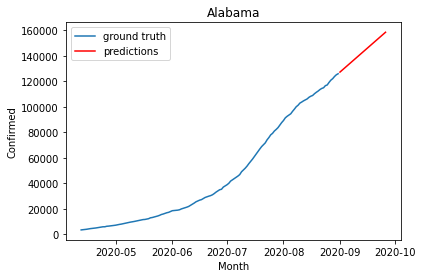

State: Alaska
	Top 3 Scores For Alaska
	--Score: 0.44260394003901515 ['add', True]
	--Score: 0.44260394003901515 ['add', True]


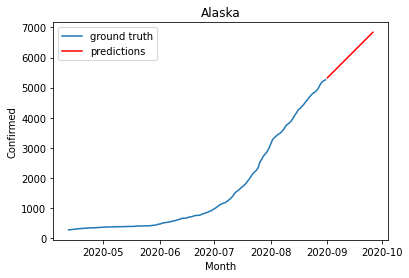

State: Arizona
	Top 3 Scores For Arizona
	--Score: 0.12922858831056286 ['add', True]
	--Score: 0.12922858831056286 ['add', True]


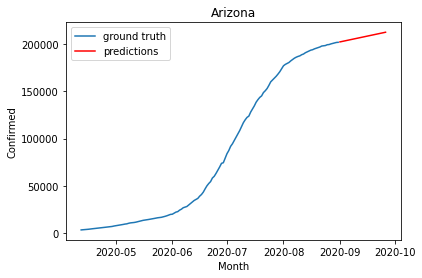

State: Arkansas
	Top 3 Scores For Arkansas
	--Score: 0.36121207348887113 ['add', True]
	--Score: 0.36121207348887113 ['add', True]


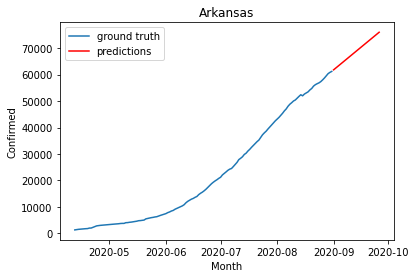

State: California
	Top 3 Scores For California
	--Score: 0.34597555155177334 ['add', True]
	--Score: 0.34597555155177334 ['add', True]


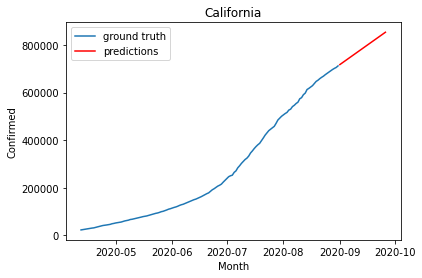

State: Colorado
	Top 3 Scores For Colorado
	--Score: 0.21616560824649858 ['add', True]
	--Score: 0.21616560824649858 ['add', True]


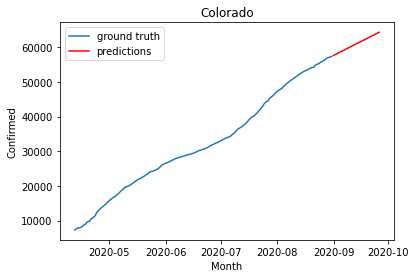

State: Connecticut
	Top 3 Scores For Connecticut
	--Score: 0.1842902475004495 ['add', True]
	--Score: 0.1842902475004495 ['add', True]


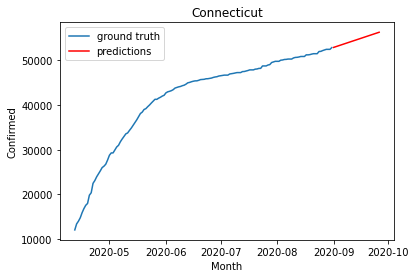

State: Delaware
	Top 3 Scores For Delaware
	--Score: 0.41485960759958745 ['add', True]
	--Score: 0.41485960759958745 ['add', True]


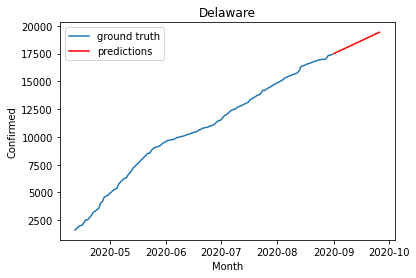

State: Florida
	Top 3 Scores For Florida
	--Score: 0.14763788749103315 ['add', True]
	--Score: 0.14763788749103315 ['add', True]


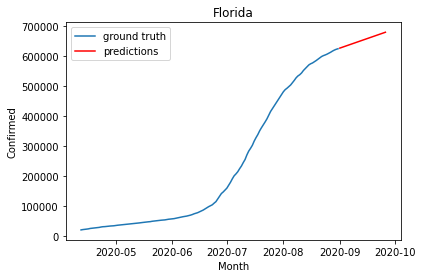

State: Georgia
	Top 3 Scores For Georgia
	--Score: 0.16706367668758423 ['add', True]
	--Score: 0.16706367668758423 ['add', True]


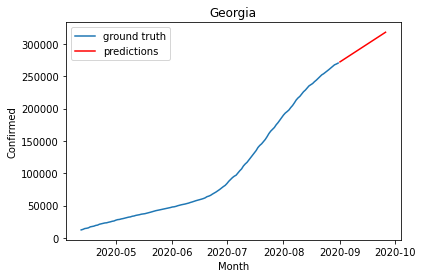

State: Hawaii
	Top 3 Scores For Hawaii
	--Score: 0.9985809994918253 ['add', True]
	--Score: 0.9985809994918253 ['add', True]


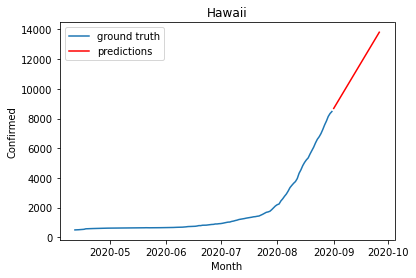

State: Idaho
	Top 3 Scores For Idaho
	--Score: 0.32611072093389426 ['add', True]
	--Score: 0.32611072093389426 ['add', True]


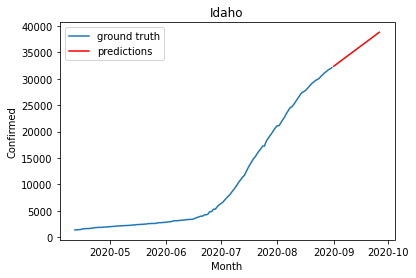

State: Illinois
	Top 3 Scores For Illinois
	--Score: 0.12154380443813843 ['add', True]
	--Score: 0.12154380443813843 ['add', True]


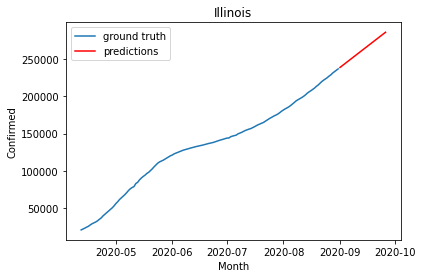

State: Indiana
	Top 3 Scores For Indiana
	--Score: 0.25781404772846417 ['add', True]
	--Score: 0.25781404772846417 ['add', True]


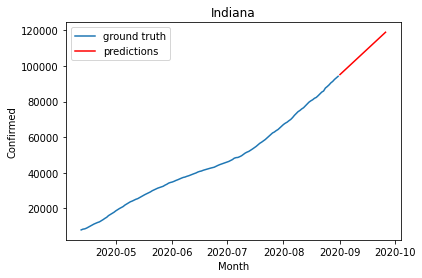

State: Iowa
	Top 3 Scores For Iowa
	--Score: 0.6202239958762265 ['add', True]
	--Score: 0.6202239958762265 ['add', True]


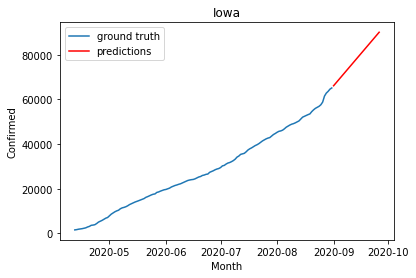

State: Kansas
	Top 3 Scores For Kansas
	--Score: 0.551672800684721 ['add', True]
	--Score: 0.551672800684721 ['add', True]


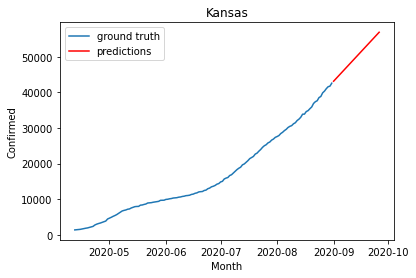

State: Kentucky
	Top 3 Scores For Kentucky
	--Score: 0.49748843634785567 ['add', True]
	--Score: 0.49748843634785567 ['add', True]


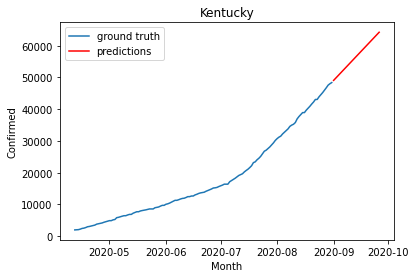

State: Louisiana
	Top 3 Scores For Louisiana
	--Score: 0.23140739212183523 ['add', True]
	--Score: 0.23140739212183523 ['add', True]


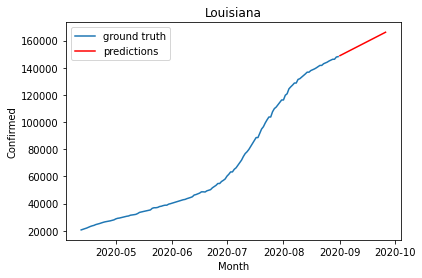

State: Maine
	Top 3 Scores For Maine
	--Score: 0.19761645411161982 ['add', True]
	--Score: 0.19761645411161982 ['add', True]


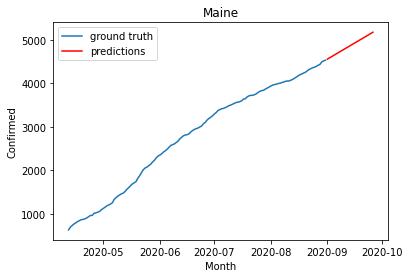

State: Maryland
	Top 3 Scores For Maryland
	--Score: 0.09900277831287436 ['add', True]
	--Score: 0.09900277831287436 ['add', True]


/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)


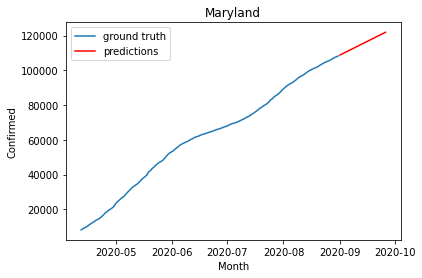

State: Massachusetts
	Top 3 Scores For Massachusetts
	--Score: 0.09368769684770178 ['add', True]
	--Score: 0.09368769684770178 ['add', True]


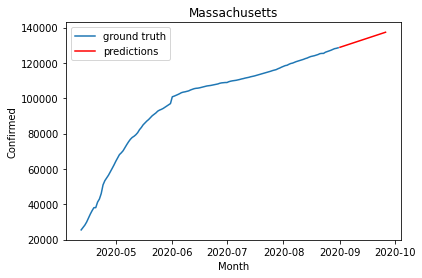

State: Michigan
	Top 3 Scores For Michigan
	--Score: 0.2793582856687587 ['add', True]
	--Score: 0.2793582856687587 ['add', True]


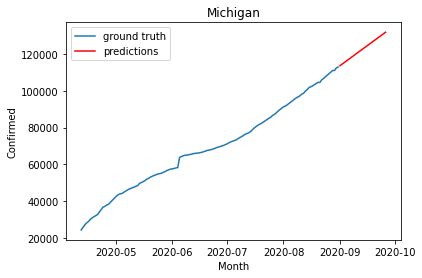

State: Minnesota
	Top 3 Scores For Minnesota
	--Score: 0.20823222708047048 ['add', True]
	--Score: 0.20823222708047048 ['add', True]


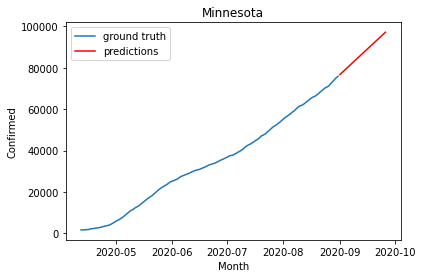

State: Mississippi
	Top 3 Scores For Mississippi
	--Score: 0.28643276024463915 ['add', True]
	--Score: 0.28643276024463915 ['add', True]


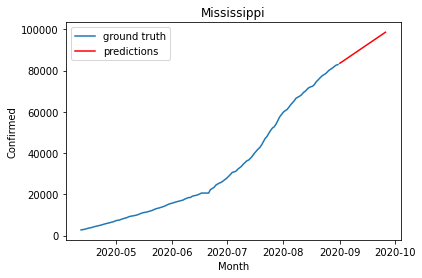

State: Missouri
	Top 3 Scores For Missouri
	--Score: 0.3129798004255209 ['add', True]
	--Score: 0.3129798004255209 ['add', True]


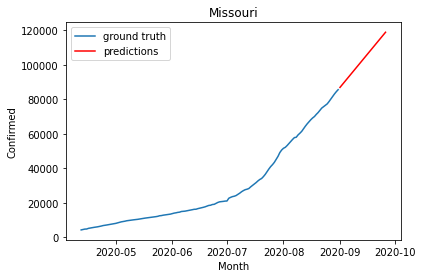

State: Montana
	Top 3 Scores For Montana
	--Score: 0.640621383093628 ['add', True]
	--Score: 0.640621383093628 ['add', True]


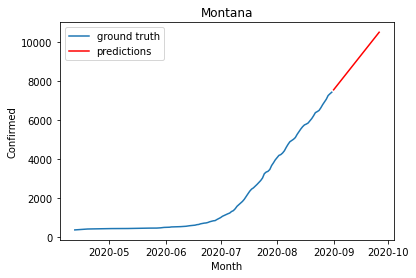

State: Nebraska
	Top 3 Scores For Nebraska
	--Score: 0.23338586676437892 ['add', True]
	--Score: 0.23338586676437892 ['add', True]


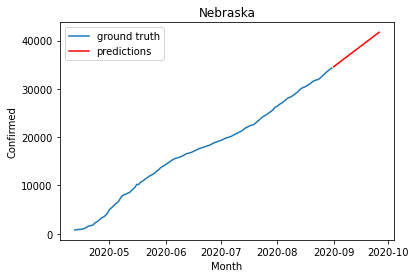

State: Nevada
	Top 3 Scores For Nevada
	--Score: 0.26960893654869983 ['add', True]
	--Score: 0.26960893654869983 ['add', True]


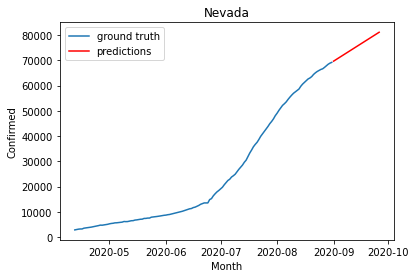

State: New Hampshire
	Top 3 Scores For New Hampshire
	--Score: 0.13189317714195478 ['add', True]
	--Score: 0.13189317714195478 ['add', True]


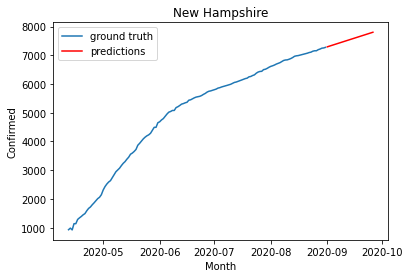

State: New Jersey
	Top 3 Scores For New Jersey
	--Score: 0.0765082076879722 ['add', True]
	--Score: 0.0765082076879722 ['add', True]


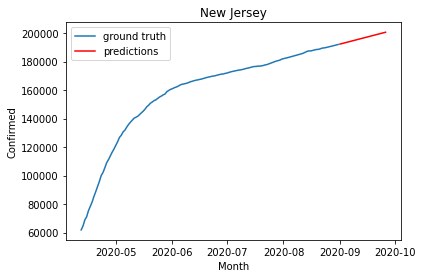

State: New Mexico
	Top 3 Scores For New Mexico
	--Score: 0.16208458421886587 ['add', True]
	--Score: 0.16208458421886587 ['add', True]


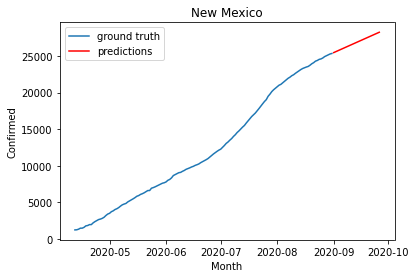

State: New York
	Top 3 Scores For New York
	--Score: 0.04118377258299346 ['add', True]
	--Score: 0.04118377258299346 ['add', True]


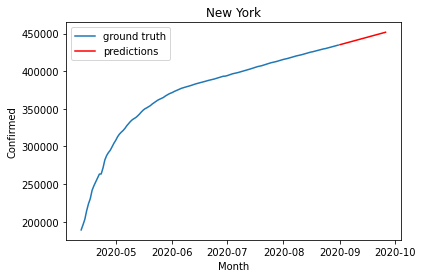

State: North Carolina
	Top 3 Scores For North Carolina
	--Score: 0.2474294894200295 ['add', True]
	--Score: 0.2474294894200295 ['add', True]


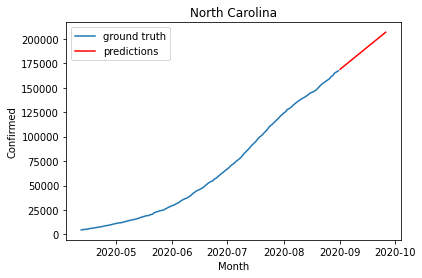

State: North Dakota
	Top 3 Scores For North Dakota
	--Score: 0.6958846961163114 ['add', True]
	--Score: 0.6958846961163114 ['add', True]


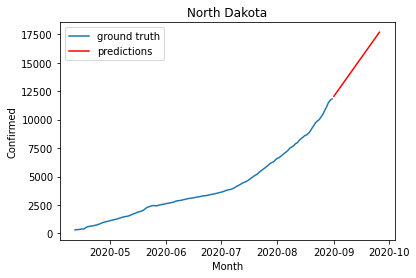

State: Ohio
	Top 3 Scores For Ohio
	--Score: 0.15542138124708402 ['add', True]
	--Score: 0.15542138124708402 ['add', True]


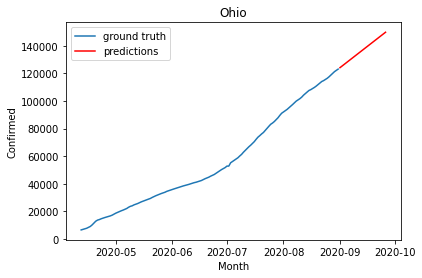

State: Oklahoma
	Top 3 Scores For Oklahoma
	--Score: 0.2803824593866827 ['add', True]
	--Score: 0.2803824593866827 ['add', True]


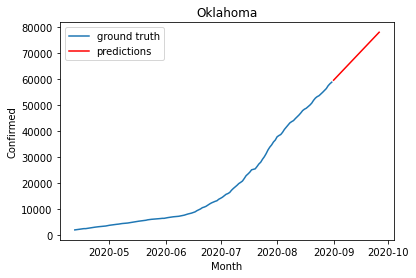

State: Oregon
	Top 3 Scores For Oregon
	--Score: 0.22565717221080295 ['add', True]
	--Score: 0.22565717221080295 ['add', True]


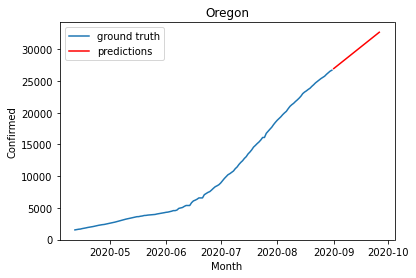

State: Pennsylvania
	Top 3 Scores For Pennsylvania
	--Score: 0.0845830536606366 ['add', True]
	--Score: 0.0845830536606366 ['add', True]


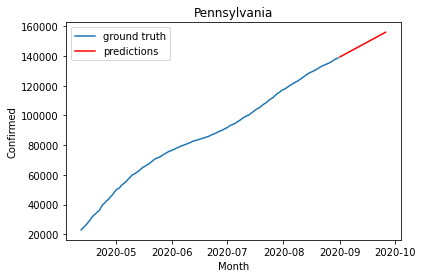

State: Rhode Island
	Top 3 Scores For Rhode Island
	--Score: 0.3260467179178131 ['add', True]
	--Score: 0.3260467179178131 ['add', True]


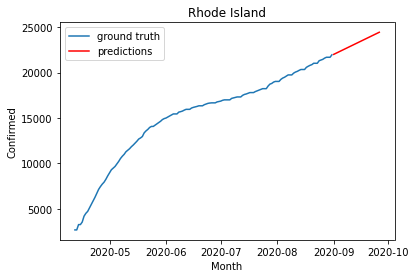

State: South Carolina
	Top 3 Scores For South Carolina
	--Score: 0.19125957144955116 ['add', True]
	--Score: 0.19125957144955116 ['add', True]


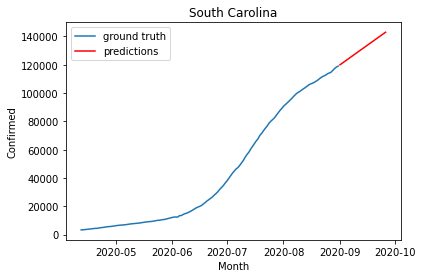

State: South Dakota
	Top 3 Scores For South Dakota
	--Score: 0.6876857975438837 ['add', True]
	--Score: 0.6876857975438837 ['add', True]


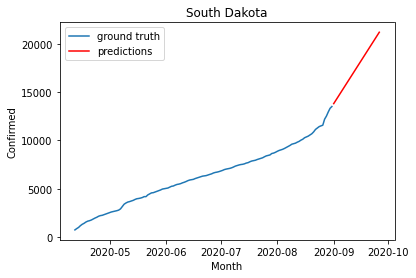

State: Tennessee
	Top 3 Scores For Tennessee
	--Score: 0.30216261704016795 ['add', True]
	--Score: 0.30216261704016795 ['add', True]


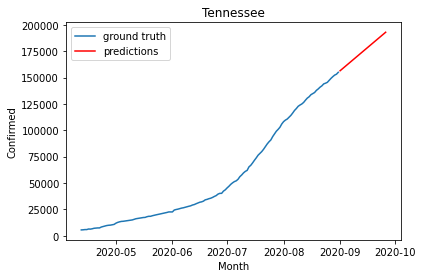

State: Texas
	Top 3 Scores For Texas
	--Score: 0.2331635976904354 ['add', True]
	--Score: 0.2331635976904354 ['add', True]


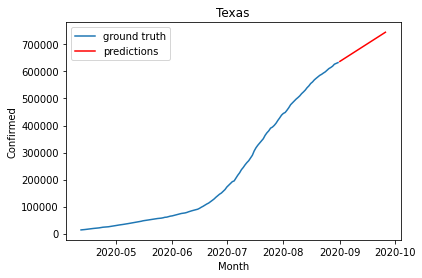

State: Utah
	Top 3 Scores For Utah
	--Score: 0.16144617346616458 ['add', True]
	--Score: 0.16144617346616458 ['add', True]


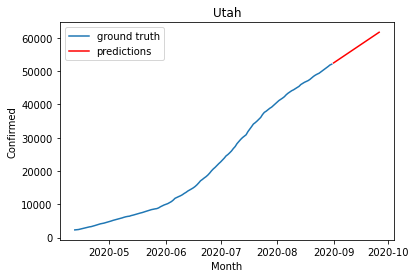

State: Vermont
	Top 3 Scores For Vermont
	--Score: 0.22159582931788488 ['add', True]
	--Score: 0.22159582931788488 ['add', True]


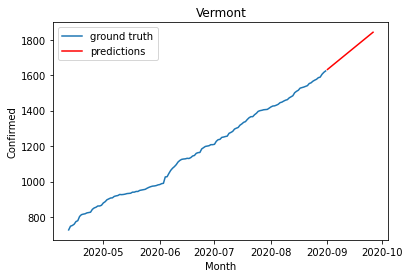

State: Virginia
	Top 3 Scores For Virginia
	--Score: 0.14590596568250003 ['add', True]
	--Score: 0.14590596568250003 ['add', True]


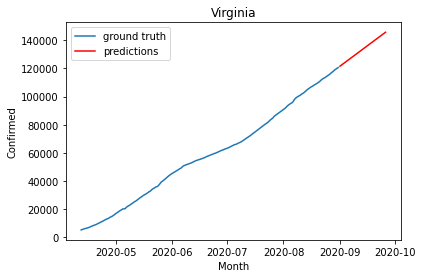

State: Washington
	Top 3 Scores For Washington
	--Score: 0.23875650337558596 ['add', True]
	--Score: 0.23875650337558596 ['add', True]


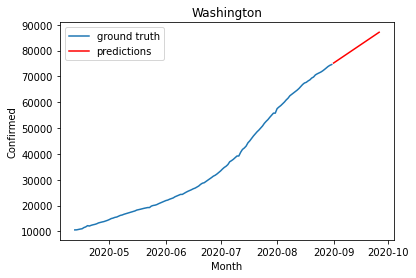

State: West Virginia
	Top 3 Scores For West Virginia
	--Score: 0.3960734674618558 ['add', True]
	--Score: 0.3960734674618558 ['add', True]


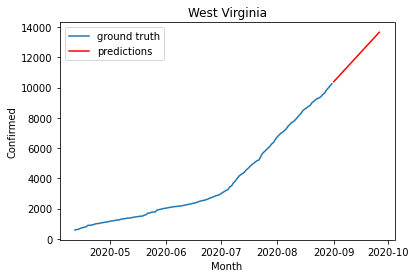

State: Wisconsin
	Top 3 Scores For Wisconsin
	--Score: 0.3681152819822404 ['add', True]
	--Score: 0.3681152819822404 ['add', True]


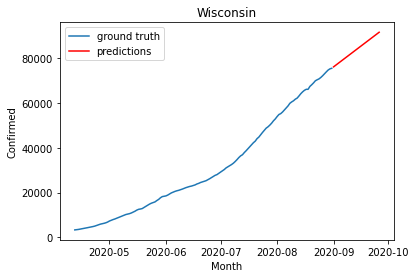

State: Wyoming
	Top 3 Scores For Wyoming
	--Score: 0.5492736278544936 ['add', True]
	--Score: 0.5492736278544936 ['add', True]


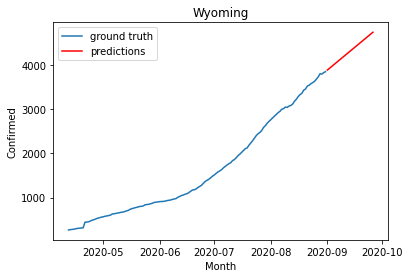

In [11]:
# Get train and test dates for plot
train_dates = sorted(list(confirmed_df.Date.unique()))
test_dates  = sorted(list(test_df.Date.unique()))

# Average overall MAPE
overall_average_MAPE = 0

# Setup dataframe to store results
confirmed_output_df = pd.DataFrame()

# Grid search for each state
for state in state_names:
  scores = grid_search(confirmed_df[confirmed_df.Province_State == state].Confirmed, cfgs, 20, state, parallel=True)
  overall_average_MAPE += scores[0][1]
  predictions = build_best_confirmed_model(train_dates, test_dates, confirmed_df[confirmed_df.Province_State == state].Confirmed, state, scores[0][0], len(test_dates))
  confirmed_output_df = confirmed_output_df.append(predictions)

In [12]:
confirmed_output_df

,Province_State,Date,Confirmed
0,Alabama,2020-09-01,127358.993523
1,Alabama,2020-09-02,128608.706458
2,Alabama,2020-09-03,129858.419393
3,Alabama,2020-09-04,131108.132329
4,Alabama,2020-09-05,132357.845264
...,...,...,...
21,Wyoming,2020-09-22,4605.262598
22,Wyoming,2020-09-23,4639.486234
23,Wyoming,2020-09-24,4673.709870
24,Wyoming,2020-09-25,4707.933506


In [13]:
# Average MAPE across validation dataset
overall_average_MAPE = overall_average_MAPE/50

print("Average MAPE for Confirmed: {}%".format(overall_average_MAPE))
f = open("ETS_Confirmed_MAPE.txt", "w")
f.write(str(overall_average_MAPE))
f.close()

confirmed_output_df = confirmed_output_df.sort_values(by=['Date', 'Province_State'])
confirmed_output_df.to_csv('ETS_Confirmed_Predictions.csv', index=False)

Average MAPE for Confirmed: 0.298186334368644%


# Deaths Dataset Modeling

### Make Plots For Each State

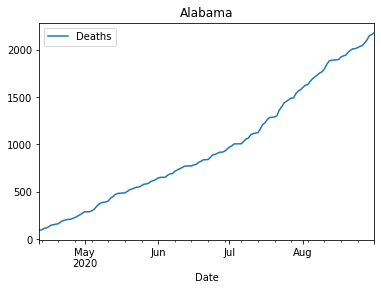

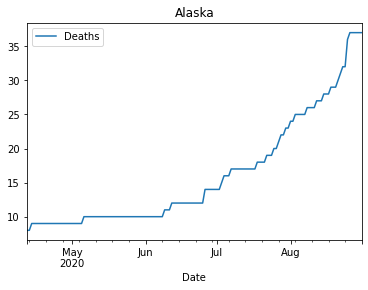

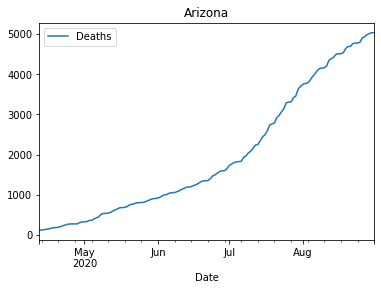

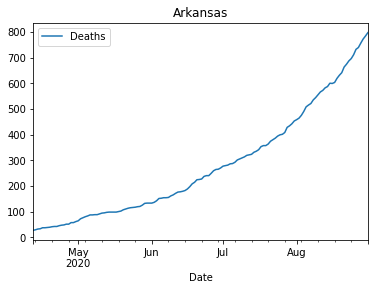

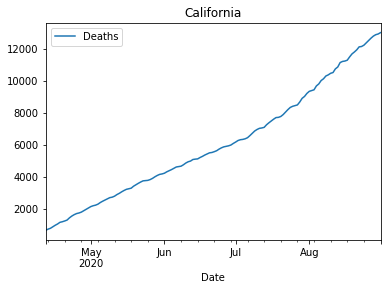

...

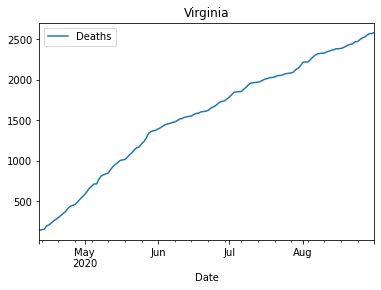

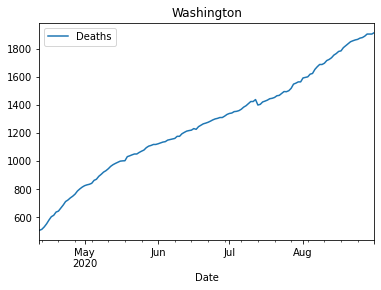

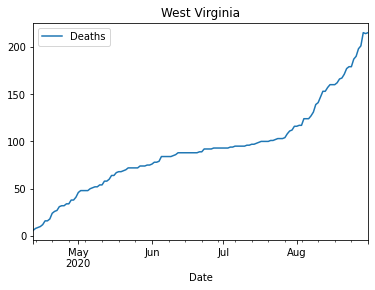

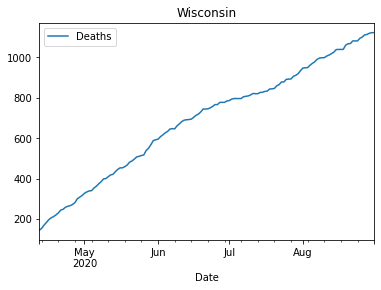

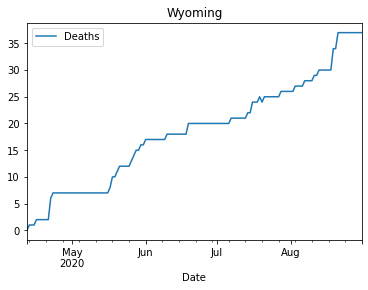

In [14]:
for state in state_names:
    state_df = deaths_df[deaths_df.Province_State == state][['Date', 'Deaths']]
    state_df.plot('Date','Deaths', title=state)
    pyplot.show()

### Fit Model

In [15]:
# Build model with best parameters
def build_best_deaths_model(train_dates, test_dates, history, state, config, num_days):
    # t, d, s, p, b, r = config
    t, r = config
    # define model
    history = array(history)
    model = ExponentialSmoothing(history, trend=t, damped=False, seasonal=None, seasonal_periods=None)
    # fit model
    model_fit = model.fit(optimized=True, remove_bias=r)
    # Make predictions
    predictions = model_fit.forecast(num_days)
    # Plot
    ground_truth, = pyplot.plot(train_dates, history, label='ground truth')
    prediction_,  = pyplot.plot(test_dates, predictions, color='red', label='predictions')
    pyplot.legend(handles=[ground_truth, prediction_])
    pyplot.title(state)
    pyplot.ylabel('Deaths')
    pyplot.xlabel('Month')
    pyplot.show()
    # Return predictions
    data = {
        'Province_State': state,
        'Date': test_dates,
        'Deaths': predictions
    }
    dataframe = pd.DataFrame(data)
    return dataframe

State: Alabama
	Top 3 Scores For Alabama
	--Score: 0.606416395340967 ['add', True]
	--Score: 0.606416395340967 ['add', True]


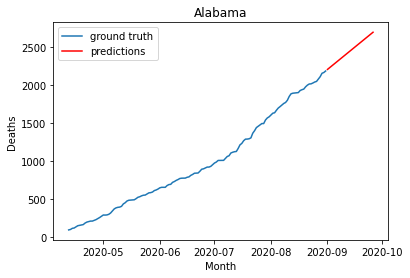

State: Alaska
	Top 3 Scores For Alaska
	--Score: 2.2390990836847116 ['add', True]
	--Score: 2.2390990836847116 ['add', True]


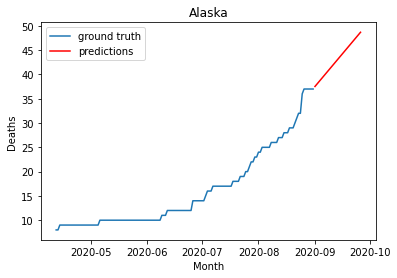

State: Arizona
	Top 3 Scores For Arizona
	--Score: 0.7438698891350295 ['add', True]
	--Score: 0.7438698891350295 ['add', True]


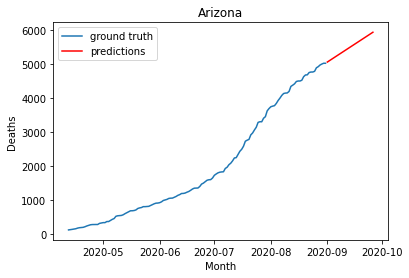

State: Arkansas
	Top 3 Scores For Arkansas
	--Score: 0.6549973607405883 ['add', True]
	--Score: 0.6549973607405883 ['add', True]


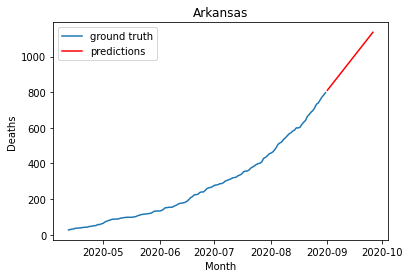

State: California
	Top 3 Scores For California
	--Score: 0.4890542331547102 ['add', True]
	--Score: 0.4890542331547102 ['add', True]


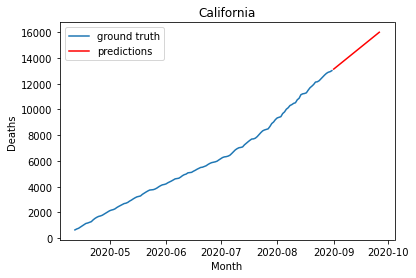

State: Colorado
	Top 3 Scores For Colorado
	--Score: 0.14732798903394637 ['add', True]
	--Score: 0.14732798903394637 ['add', True]


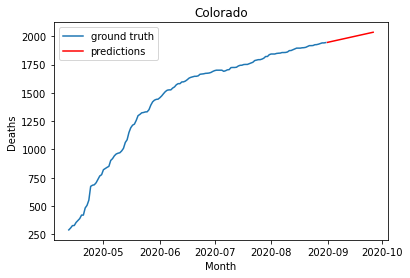

State: Connecticut
	Top 3 Scores For Connecticut
	--Score: 0.0841115094936304 ['add', True]
	--Score: 0.0841115094936304 ['add', True]


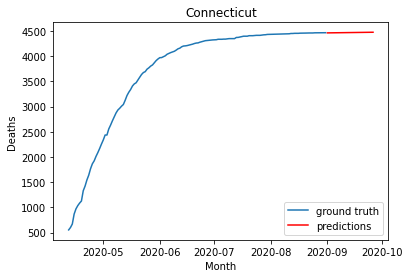

State: Delaware
	Top 3 Scores For Delaware
	--Score: 0.22275688411236289 ['add', True]
	--Score: 0.22275688411236289 ['add', True]


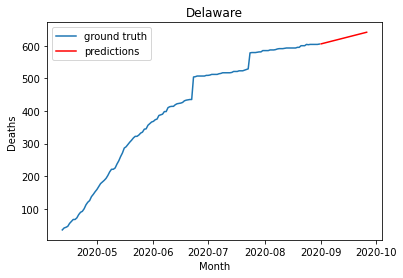

State: Florida
	Top 3 Scores For Florida
	--Score: 0.494675909451576 ['add', True]
	--Score: 0.494675909451576 ['add', True]


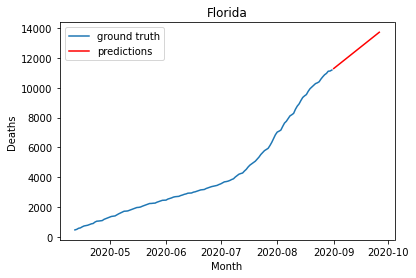

State: Georgia
	Top 3 Scores For Georgia
	--Score: 0.5678982861065617 ['add', True]
	--Score: 0.5678982861065617 ['add', True]


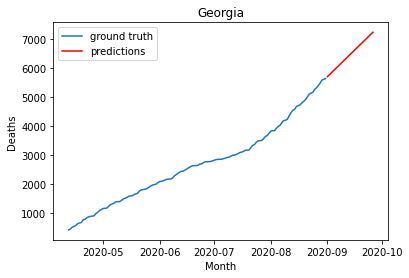

State: Hawaii
	Top 3 Scores For Hawaii
	--Score: 3.0505238935616763 ['add', True]
	--Score: 3.0505238935616763 ['add', True]


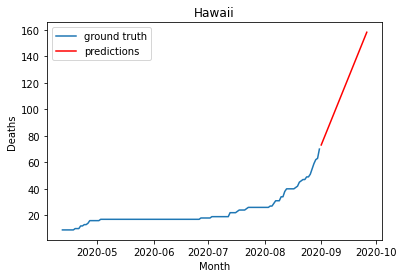

State: Idaho
	Top 3 Scores For Idaho
	--Score: 1.2500203094891489 ['add', True]
	--Score: 1.2500203094891489 ['add', True]


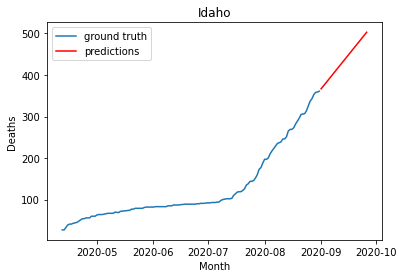

State: Illinois
	Top 3 Scores For Illinois
	--Score: 0.10759052768096142 ['add', True]
	--Score: 0.10759052768096142 ['add', True]


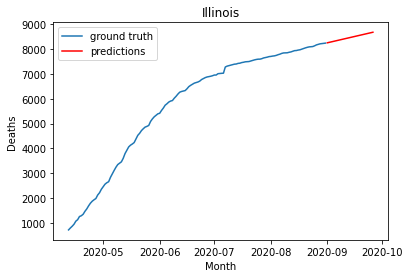

State: Indiana
	Top 3 Scores For Indiana
	--Score: 0.17959424017340858 ['add', True]
	--Score: 0.17959424017340858 ['add', True]


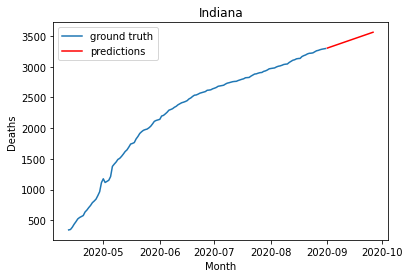

State: Iowa
	Top 3 Scores For Iowa
	--Score: 0.4675086058235879 ['add', True]
	--Score: 0.4675086058235879 ['add', True]


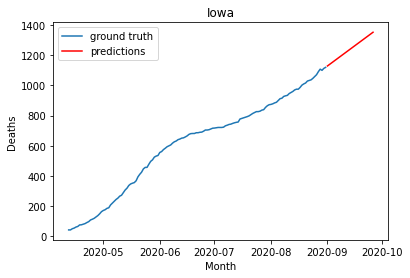

State: Kansas
	Top 3 Scores For Kansas
	--Score: 0.5757607616734363 ['add', True]
	--Score: 0.5757607616734363 ['add', True]


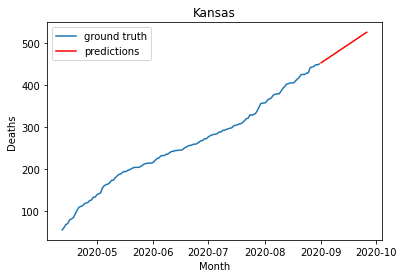

State: Kentucky
	Top 3 Scores For Kentucky
	--Score: 0.41675583404203337 ['add', True]
	--Score: 0.41675583404203337 ['add', True]


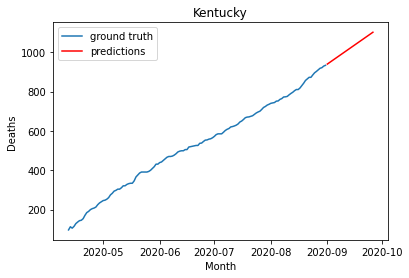

State: Louisiana
	Top 3 Scores For Louisiana
	--Score: 0.3477482065264918 ['add', True]
	--Score: 0.3477482065264918 ['add', True]


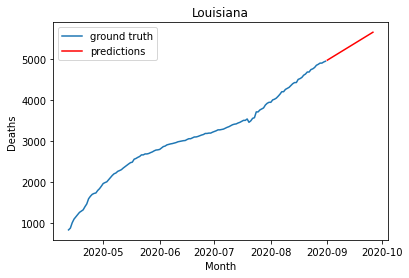

State: Maine
	Top 3 Scores For Maine
	--Score: 0.3282588584382668 ['add', True]
	--Score: 0.3282588584382668 ['add', True]


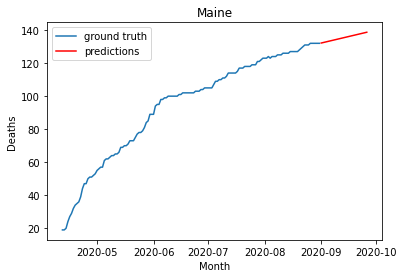

State: Maryland
	Top 3 Scores For Maryland
	--Score: 0.09485139970331176 ['add', True]
	--Score: 0.09485139970331176 ['add', True]


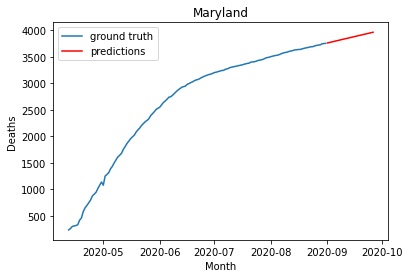

State: Massachusetts
	Top 3 Scores For Massachusetts
	--Score: 0.09032402260053962 ['add', True]
	--Score: 0.09032402260053962 ['add', True]


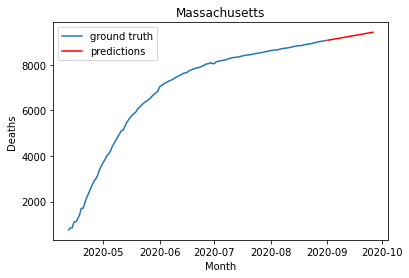

State: Michigan
	Top 3 Scores For Michigan
	--Score: 0.13134259582771377 ['add', True]
	--Score: 0.13134259582771377 ['add', True]


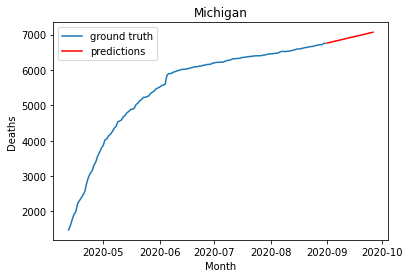

State: Minnesota
	Top 3 Scores For Minnesota
	--Score: 0.47269915678667795 ['add', True]
	--Score: 0.47269915678667795 ['add', True]


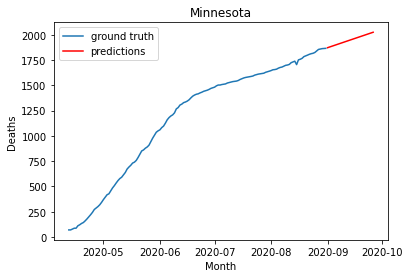

State: Mississippi
	Top 3 Scores For Mississippi
	--Score: 0.6142168035090235 ['add', True]
	--Score: 0.6142168035090235 ['add', True]


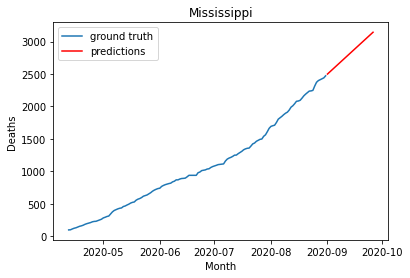

State: Missouri
	Top 3 Scores For Missouri
	--Score: 0.3868240231260154 ['add', True]
	--Score: 0.3868240231260154 ['add', True]


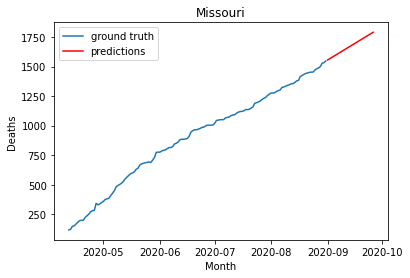

State: Montana
	Top 3 Scores For Montana
	--Score: 1.6970247092707953 ['add', True]
	--Score: 1.6970247092707953 ['add', True]


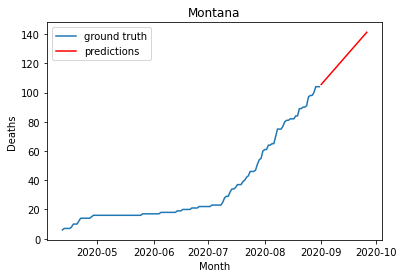

State: Nebraska
	Top 3 Scores For Nebraska
	--Score: 0.5191835277243918 ['add', True]
	--Score: 0.5191835277243918 ['add', True]


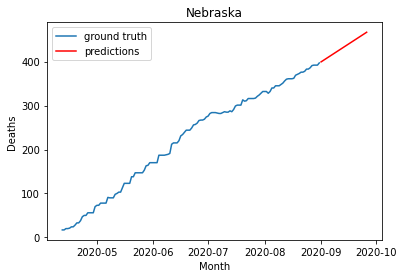

State: Nevada
	Top 3 Scores For Nevada
	--Score: 0.8824373509036701 ['add', True]
	--Score: 0.8824373509036701 ['add', True]


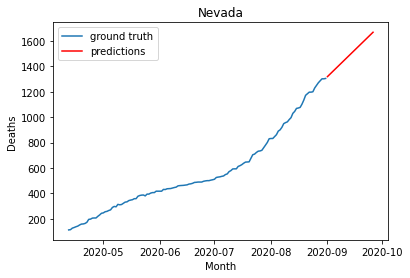

State: New Hampshire
	Top 3 Scores For New Hampshire
	--Score: 0.1654419652564815 ['add', True]
	--Score: 0.1654419652564815 ['add', True]


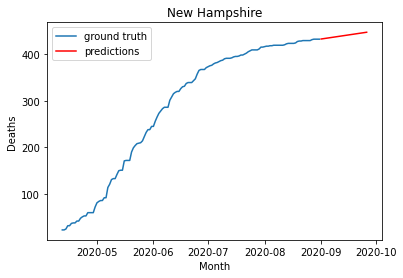

State: New Jersey
	Top 3 Scores For New Jersey
	--Score: 0.11817103252620972 ['add', True]
	--Score: 0.11817103252620972 ['add', True]


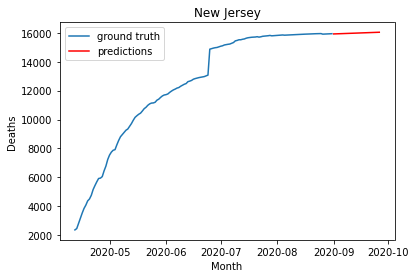

State: New Mexico
	Top 3 Scores For New Mexico
	--Score: 0.2678595831838368 ['add', True]
	--Score: 0.2678595831838368 ['add', True]


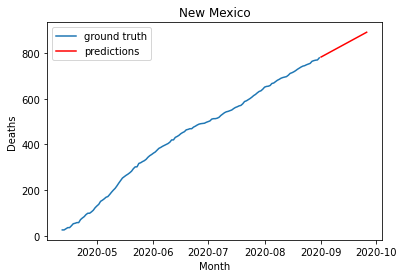

State: New York
	Top 3 Scores For New York
	--Score: 0.11717374851934886 ['add', True]
	--Score: 0.11717374851934886 ['add', True]


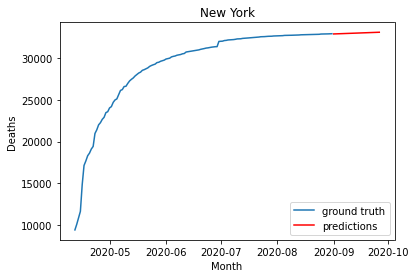

State: North Carolina
	Top 3 Scores For North Carolina
	--Score: 0.4699866295865863 ['add', True]
	--Score: 0.4699866295865863 ['add', True]


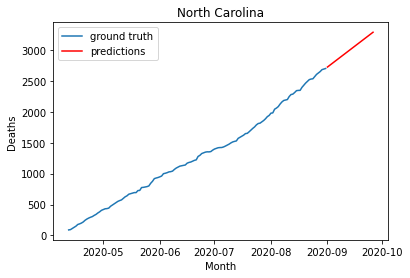

State: North Dakota
	Top 3 Scores For North Dakota
	--Score: 0.6931496733575812 ['add', True]
	--Score: 0.6931496733575812 ['add', True]


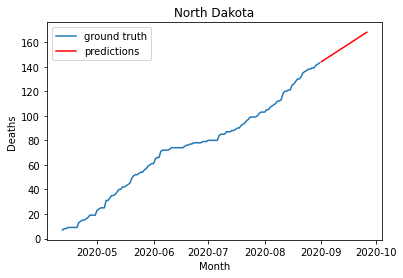

State: Ohio
	Top 3 Scores For Ohio
	--Score: 0.6307153711143753 ['add', True]
	--Score: 0.6307153711143753 ['add', True]


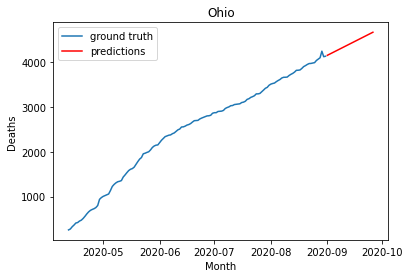

State: Oklahoma
	Top 3 Scores For Oklahoma
	--Score: 0.6862598878169529 ['add', True]
	--Score: 0.6862598878169529 ['add', True]


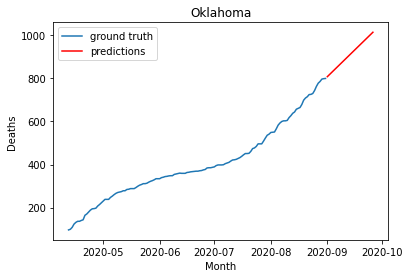

State: Oregon
	Top 3 Scores For Oregon
	--Score: 0.773233887967304 ['add', True]
	--Score: 0.773233887967304 ['add', True]


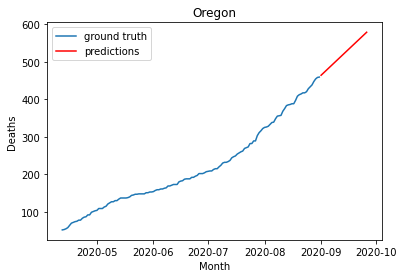

State: Pennsylvania
	Top 3 Scores For Pennsylvania
	--Score: 0.14956512767941108 ['add', True]
	--Score: 0.14956512767941108 ['add', True]


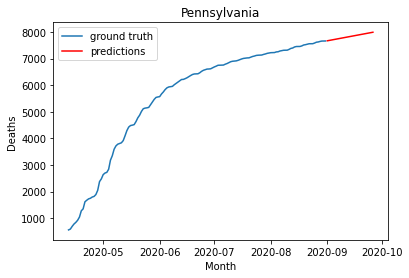

State: Rhode Island
	Top 3 Scores For Rhode Island
	--Score: 0.1329813706691221 ['add', True]
	--Score: 0.1329813706691221 ['add', True]


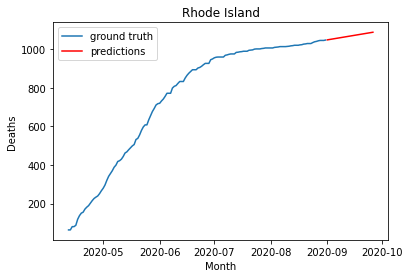

State: South Carolina
	Top 3 Scores For South Carolina
	--Score: 0.7047270171257095 ['add', True]
	--Score: 0.7047270171257095 ['add', True]


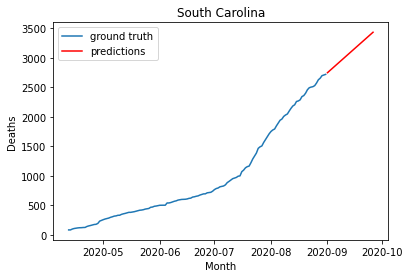

State: South Dakota
	Top 3 Scores For South Dakota
	--Score: 0.44683487315868564 ['add', True]
	--Score: 0.44683487315868564 ['add', True]


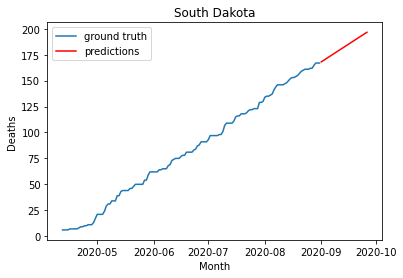

State: Tennessee
	Top 3 Scores For Tennessee
	--Score: 0.5966895674181473 ['add', True]
	--Score: 0.5966895674181473 ['add', True]


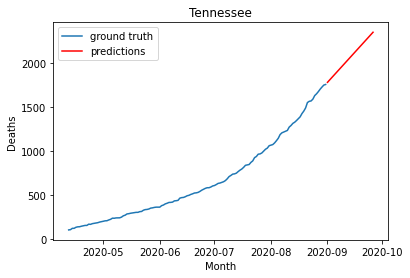

State: Texas
	Top 3 Scores For Texas
	--Score: 0.610853992781041 ['add', True]
	--Score: 0.610853992781041 ['add', True]


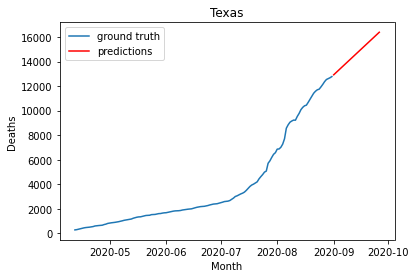

State: Utah
	Top 3 Scores For Utah
	--Score: 0.6597155596904896 ['add', True]
	--Score: 0.6597155596904896 ['add', True]


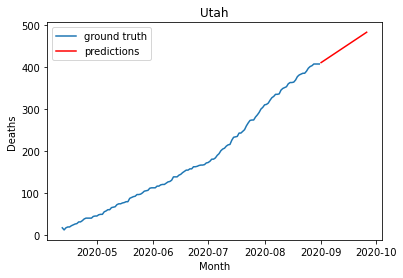

State: Vermont
	Top 3 Scores For Vermont
	--Score: 0.07516778377904179 ['add', True]
	--Score: 0.07516778377904179 ['add', True]


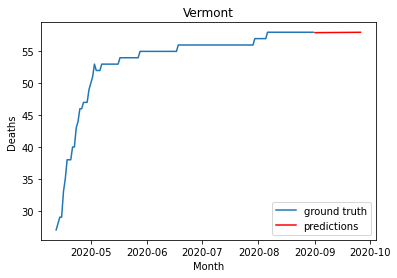

State: Virginia
	Top 3 Scores For Virginia
	--Score: 0.24919136110885565 ['add', True]
	--Score: 0.24919136110885565 ['add', True]


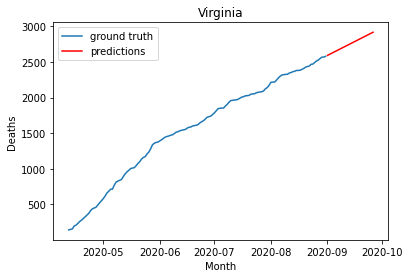

State: Washington
	Top 3 Scores For Washington
	--Score: 0.2593266586525208 ['add', True]
	--Score: 0.2593266586525208 ['add', True]


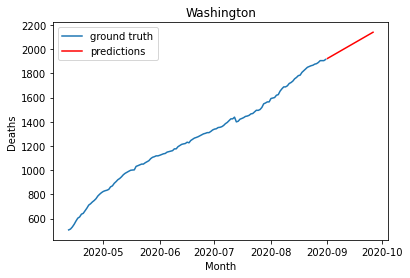

State: West Virginia
	Top 3 Scores For West Virginia
	--Score: 1.5786223041212923 ['add', True]
	--Score: 1.5786223041212923 ['add', True]


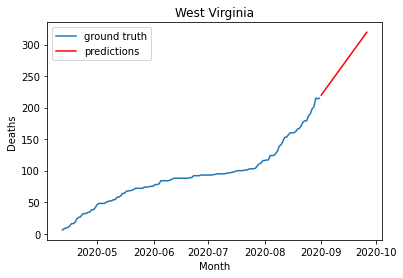

State: Wisconsin
	Top 3 Scores For Wisconsin
	--Score: 0.4410727541990258 ['add', True]
	--Score: 0.4410727541990258 ['add', True]


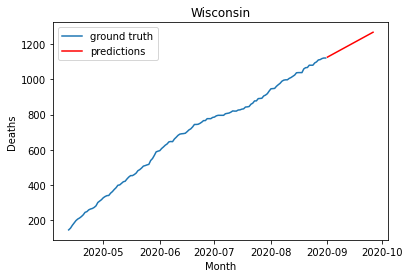

State: Wyoming
	Top 3 Scores For Wyoming
	--Score: 1.6842002227300452 ['add', True]
	--Score: 1.6842002227300452 ['add', True]


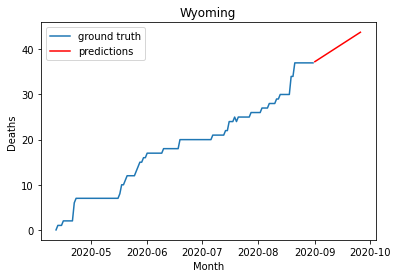

In [16]:
# Get all configs
cfgs = exp_smoothing_configs(None)

# Get train and test dates for plot
train_dates = sorted(list(deaths_df.Date.unique()))
test_dates  = sorted(list(test_df.Date.unique()))

# Average overall MAPE
overall_average_MAPE = 0

# Setup dataframe to store results
deaths_output_df = pd.DataFrame()

# Grid search for each state
for state in state_names:
  scores = grid_search(deaths_df[deaths_df.Province_State == state].Deaths, cfgs, 20, state, parallel=True)
  overall_average_MAPE += scores[0][1]
  predictions = build_best_deaths_model(train_dates, test_dates, deaths_df[deaths_df.Province_State == state].Deaths, state, scores[0][0], len(test_dates))
  deaths_output_df = deaths_output_df.append(predictions)

In [17]:
deaths_output_df

,Province_State,Date,Deaths
0,Alabama,2020-09-01,2202.478203
1,Alabama,2020-09-02,2222.031125
2,Alabama,2020-09-03,2241.584046
3,Alabama,2020-09-04,2261.136968
4,Alabama,2020-09-05,2280.689889
...,...,...,...
21,Wyoming,2020-09-22,42.743017
22,Wyoming,2020-09-23,43.003689
23,Wyoming,2020-09-24,43.264361
24,Wyoming,2020-09-25,43.525033


In [18]:
# Average MAPE across validation dataset
overall_average_MAPE = overall_average_MAPE/50

print("Average MAPE for Deaths: {}%".format(overall_average_MAPE))
f = open("ETS_Deaths_MAPE.txt", "w")
f.write(str(overall_average_MAPE))
f.close()
 
deaths_output_df = deaths_output_df.sort_values(by=['Date', 'Province_State'])
deaths_output_df.to_csv('ETS_Deaths_Predictions.csv', index=False)

Average MAPE for Deaths: 0.587476254791146%


# Create Required Submission

In [19]:
confirmed_predictions = pd.read_csv('ETS_Confirmed_Predictions.csv')
confirmed_predictions.head()

,Province_State,Date,Confirmed
0,Alabama,2020-09-01,127358.993523
1,Alaska,2020-09-01,5324.862026
2,Arizona,2020-09-01,202259.297343
3,Arkansas,2020-09-01,61808.860220
4,California,2020-09-01,717976.537510


In [20]:
deaths_predictions = pd.read_csv('ETS_Deaths_Predictions.csv')
deaths_predictions.head()

,Province_State,Date,Deaths
0,Alabama,2020-09-01,2202.478203
1,Alaska,2020-09-01,37.521778
2,Arizona,2020-09-01,5065.522828
3,Arkansas,2020-09-01,810.581845
4,California,2020-09-01,13139.791515


In [21]:
test_df['Confirmed'] = confirmed_predictions['Confirmed']
test_df['Deaths'] = deaths_predictions['Deaths']

In [22]:
test_df[test_df.Province_State == 'Pennsylvania']

,ForecastID,Province_State,Date,Confirmed,Deaths
37,37,Pennsylvania,2020-09-01,139434.431784,7666.747413
87,87,Pennsylvania,2020-09-02,140097.891387,7679.577513
137,137,Pennsylvania,2020-09-03,140761.350991,7692.407613
187,187,Pennsylvania,2020-09-04,141424.810595,7705.237713
237,237,Pennsylvania,2020-09-05,142088.270198,7718.067813
287,287,Pennsylvania,2020-09-06,142751.729802,7730.897913
337,337,Pennsylvania,2020-09-07,143415.189406,7743.728013
387,387,Pennsylvania,2020-09-08,144078.649009,7756.558113
437,437,Pennsylvania,2020-09-09,144742.108613,7769.388213
487,487,Pennsylvania,2020-09-10,145405.568216,7782.218313


In [23]:
test_df.drop(['Province_State','Date'], inplace=True, axis=1)
test_df.head()

,ForecastID,Confirmed,Deaths
0,0,127358.993523,2202.478203
1,1,5324.862026,37.521778
2,2,202259.297343,5065.522828
3,3,61808.860220,810.581845
4,4,717976.537510,13139.791515


In [24]:
test_df.to_csv('ETS_submission_nodampingorseasonalityremovebiasremoveboxcox.csv', index=False)
!cp ETS_submission_nodampingorseasonalityremovebiasremoveboxcox.csv "drive/My Drive/UCLA/Classes/Computer Science/CS145/Team 3 - Kaggle/Data/"